Imports

In [3]:
import pandas as pd
import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import nltk
import re
from nltk import sent_tokenize
from nltk import word_tokenize
from nltk.corpus import stopwords
import re
import string
from string import punctuation
from collections import Counter
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import StemmerI, RegexpStemmer, LancasterStemmer, ISRIStemmer, PorterStemmer, SnowballStemmer, RSLPStemmer
from nltk.corpus import wordnet
import pickle
import sklearn
from sklearn.manifold import TSNE
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim, logging
#from gensim import corpora, models, similarities
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from wordcloud import WordCloud,STOPWORDS
from sklearn import svm
from sklearn.metrics import f1_score
from numpy  import array
from textblob import TextBlob

In the loadData functions, we will load data and remove unecessary columns. 

In [4]:
def loadData1 ():
    
    Location = r'C:\Users\Foufa\Desktop\Project\twitter_data\train2017.tsv'
    train_data = pd.read_csv(Location, sep='\t+', engine='python', escapechar="\\", header=None, names=['tweet_id','something','sentiment','tweet_text']) #seperator=\t
    
    #Drop unnecessary columns
    train_data.drop(['something'], axis=1, inplace=True)
    
    return train_data

def loadData2 ():
    
    Location = r'C:\Users\Foufa\Desktop\Project\twitter_data\test2017.tsv'
    test_data = pd.read_csv(Location, sep='\t+', engine='python', escapechar="\\", header=None, names=['tweet_id','something','sentiment','tweet_text']) #seperator=\t
    
    #Drop unnecessary columns
    test_data.drop(['something'], axis=1, inplace=True)
    
    return test_data

def loadData3 ():
    
    Location = r'C:\Users\Foufa\Desktop\Project\twitter_data\SemEval2017_task4_subtaskA_test_english_gold.txt'
    answers = pd.read_csv(Location, sep='\t+', engine='python', escapechar="\\", header=None, names=['tweet_id','sentiment']) #seperator=\t
    
    #Drop unnecessary columns
    #sent.drop(['tweet_id'], axis=1, inplace=True)
    
    return answers

def loadlex ():
    
    Location = r'C:\Users\Foufa\Desktop\Project\lexica\affin\affin.txt'
    lex = pd.read_csv(Location, sep='\t+', engine='python', escapechar="\\", header=None, names=['word','sentiment']) #seperator=\t
    return lex

Calling loadData function

In [8]:
train_data = loadData1 ()
test_data = loadData2 ()
lex = loadlex ()

The preProcessTweet function takes a tweet and does some pre-processing on the tweet

In [4]:
def preProcessTweet(tweet):
    
    #Replace the text with lowercase letters
    tweet = tweet.lower()
    
    #Replace all words preceded by '@' with ''
    tweet = re.sub(r'@[^\s]+', '', tweet)
    
    #Replace all url's with ''
    tweet = re.sub(r'www.[^\s]+ | http[^\s]+','', tweet)
    
    #Replace all hashtags with the word
    tweet = tweet.strip('#')
    
    #Remove punctuation
    tweet = re.sub(r'[^\w\s]','', tweet)
    
    #Replace all numbers with ''
    tweet = re.sub(r'\d+','', tweet)
    
    #Replace words with long repeated characters with the shorter form
    tweet = re.sub(r'(.)\1{2,}', r'\1', tweet)
    
    #Remove any extra white space
    tweet = re.sub(r'[\s]+', ' ', tweet)
    
    return tweet

Calling preProcessTweet function for train_data and test_data

In [5]:
train_data['tweet_text'] = train_data['tweet_text'].apply(preProcessTweet)
test_data['tweet_text'] = test_data['tweet_text'].apply(preProcessTweet)

The wordTokenizeTweet(tweet) function takes a tweet and splits it into words

In [5]:
def wordTokenizeTweet(tweet):
    token = word_tokenize(tweet) 
    #print(token)
    return token

Calling wordTokenizeTweet(tweet) function for train_data and test_data

In [7]:
train_data['tweet_text'] = train_data['tweet_text'].apply(wordTokenizeTweet)
test_data['tweet_text'] = test_data['tweet_text'].apply(wordTokenizeTweet)

The stopwordsTweet(tweet) function takes a tweet and removes the stopwords

In [8]:
def stopwordsTweet(tweet):
    filtered = [w for w in tweet if not w in stopwords.words('english')]
    return filtered

Calling stopwordsTweet(tweet) function for train_data and test_data

In [9]:
train_data['tweet_text'] = train_data['tweet_text'].apply(stopwordsTweet)
test_data['tweet_text'] = test_data['tweet_text'].apply(stopwordsTweet)

In [10]:
#word_list=[]
#for x in range(0,train_data['tweet_text'].count()):
#    word_list= word_list + train_data['tweet_text'][x]
##word_list
#for x in range(0,train_data['tweet_text'].count()):
#    count = Counter(word_list)
#print(count.most_common(10))

Stemming

In [11]:
def StemTweet(tweet):
    stemmer = PorterStemmer()
    stem_output = [stemmer.stem(w) for w in tweet]
    #stems = [  stemmer.stem(token) for token in tokens ]
    #print(stems)
    return stem_output 

Calling stemTweet(tweet) function for train_data and test_data

In [12]:
train_data['tweet_text'] = train_data['tweet_text'].apply(StemTweet)
test_data['tweet_text'] = test_data['tweet_text'].apply(StemTweet)

Lemmatize

In [13]:
# Lemmatize with POS Tag
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)


def LemmatizeTweet(tweet):
    lemmatized_output=[]
    lemmatizer = WordNetLemmatizer()
    
    
    #lemmatized_output = [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in tweet]
    
    
    for w in tweet:
        token=lemmatizer.lemmatize(w, get_wordnet_pos(w))
        lemmatized_output.append(token)
    #print(lemmatized_output)
    
    
    
    return lemmatized_output  

Calling LemmatizeTweet(tweet) function for train_data and test_data

In [14]:
train_data['tweet_text'] = train_data['tweet_text'].apply(LemmatizeTweet)
test_data['tweet_text'] = test_data['tweet_text'].apply(LemmatizeTweet)

Now we finished cleaning the data we will then convert the tweets from list of words to sentences again and we will pickle the data to disk to allow for faster loading

In [15]:
def  TweetToSentence(tweet):
    seq=tweet
    x=' '.join( seq )
    return x

#apply the above function to our data

train_data['tweet_text']=train_data['tweet_text'].apply(TweetToSentence)
test_data['tweet_text']=test_data['tweet_text'].apply(TweetToSentence)

train_data.to_pickle('cleaned_train_data.pkl')
test_data.to_pickle('cleaned_test_data.pkl')

We load the pickled data

In [16]:
cleaned_train_data = pd.read_pickle('cleaned_train_data.pkl')
cleaned_test_data = pd.read_pickle('cleaned_test_data.pkl')
cleaned_train_data

,tweet_id,sentiment,tweet_text
0,264183816548130816,positive,ga hous hit im go chapel hill sat
1,263405084770172928,negative,theo walcott still shit watch rafa johnni deal...
2,262163168678248449,negative,im gsp fan hate nick diaz cant wait februari
3,264249301910310912,negative,iranian gener say israel iron dome cant deal m...
4,262682041215234048,neutral,tehran mon amour obama tri establish tie mulla...
5,264229576773861376,neutral,sat whole movi harri ron christma ohlawd
6,264105751826538497,positive,j davlar th main rival team poland hope make s...
7,264094586689953794,negative,talk act sat decid want go colleg appli colleg...
8,212392538055778304,neutral,happi valentin day trend th februari th june smh
9,254941790757601280,negative,may superbowl dalla dalla aint win superbowl q...


Data Analysis and word clouds for train data

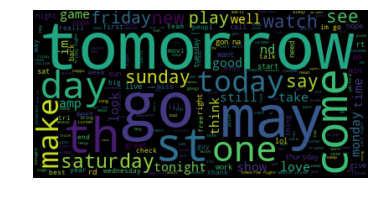

In [9]:
#### word clouds for all the tweets ####

wordcloud = WordCloud().generate(' '.join(cleaned_train_data['tweet_text']))
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

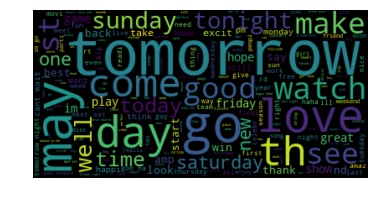

In [10]:
#### word clouds for positive tweets only ####

positive_tweet_list=[]
for x in range(0,cleaned_train_data['tweet_text'].count()):
    if cleaned_train_data['sentiment'][x]=='positive':
        positive_tweet_list.append(cleaned_train_data['tweet_text'][x])
positive_tweet_list

wordcloud = WordCloud().generate(' '.join(positive_tweet_list))
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

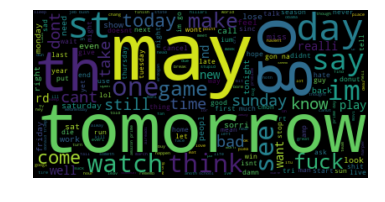

In [11]:
#### word clouds for negative tweets only ####

negative_tweet_list=[]
for x in range(0,cleaned_train_data['tweet_text'].count()):
    if cleaned_train_data['sentiment'][x]=='negative':
        negative_tweet_list.append(cleaned_train_data['tweet_text'][x])
negative_tweet_list

wordcloud = WordCloud().generate(' '.join(negative_tweet_list))
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

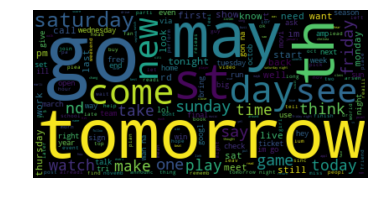

In [12]:
#### word clouds for neutral tweets only ####

neutral_tweet_list=[]
for x in range(0,cleaned_train_data['tweet_text'].count()):
    if cleaned_train_data['sentiment'][x]=='neutral':
        neutral_tweet_list.append(cleaned_train_data['tweet_text'][x])
neutral_tweet_list

wordcloud = WordCloud().generate(' '.join(neutral_tweet_list))
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

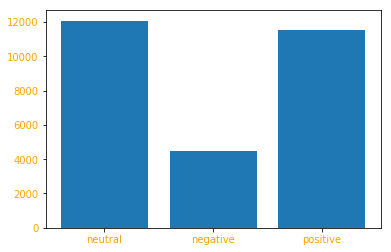

In [13]:
nlist = len(neutral_tweet_list)
neglist = len(negative_tweet_list)
plist = len(positive_tweet_list)
# Choose the height of the bars
height = [nlist, neglist, plist]
# Choose the names of the bars
bars = ['neutral', 'negative', 'positive']
y_pos = np.arange(len(bars))
plt.bar(y_pos, height)
# Create names on the x-axis
plt.xticks(y_pos, bars, color='orange')
plt.yticks(color='orange')
# Show graphic
plt.show()

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001EEE2FD08D0>],
      dtype=object)

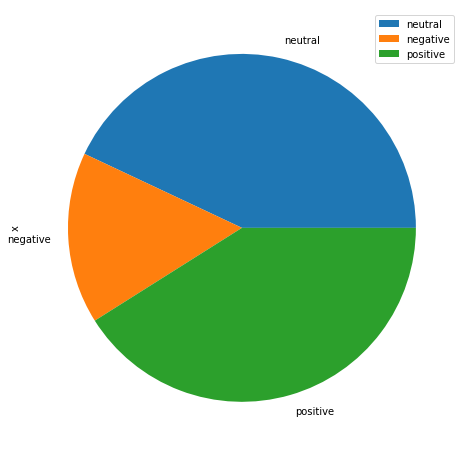

In [14]:
df = pd.DataFrame([nlist, neglist, plist], index=['neutral', 'negative', 'positive'], columns=['x'])
 
# make the plot
df.plot(kind='pie', subplots=True, figsize=(8, 8))

Tweet polarity and Subjectivity.Polarity rating of tweets from -1 (most negative) to 1 (most positive). Also show how subjective statements are from a scale of 0 to 1.

In [20]:
print('Tweet   |     Polarity     |     Subjectivity')
for val in train_data.tweet_text:
    sentiments=TextBlob(val)
    print('---------------')
    print(val,end='')
    print(' ',end='')
    print(sentiments.polarity,end='')
    print(' |  ',end='')
    print(sentiments.subjectivity)

Tweet   |     Polarity     |     Subjectivity
---------------
Gas by my house hit $3.39!!!! I'm going to Chapel Hill on Sat. :) 0.5 |  1.0
---------------
Theo Walcott is still shit, watch Rafa and Johnny deal with him on Saturday. -0.2 |  0.8
---------------
its not that I'm a GSP fan, i just hate Nick Diaz. can't wait for february. -0.8 |  0.9
---------------
Iranian general says Israel's Iron Dome can't deal with their missiles (keep talking like that and we may end up finding out) 0.05000000000000002 |  0.5
---------------
Tehran, Mon Amour: Obama Tried to Establish Ties with the Mullahs http://t.co/TZZzrrKa via @PJMedia_com No Barack Obama - Vote Mitt Romney 0.0 |  0.0
---------------
I sat through this whole movie just for Harry and Ron at christmas. ohlawd 0.2 |  0.4
---------------
with J Davlar 11th. Main rivals are team Poland. Hopefully we an make it a successful end to a tough week of training tomorrow. 0.1759259259259259 |  0.7055555555555556
---------------
Talking about 

Full Moon:Oct 29th. You can read more if you have your Sun Sign in Libra, Scorpio, Sag, Cap, Aqua or Pisces http://t.co/HNgb7Qn3 0.425 |  0.525
---------------
Drew Peterson may be convicted, but there is still conflict going on http://t.co/lmqKV7XZ #whenwillitend #localnews #chicago 0.0 |  0.0
---------------
@WFAN660 Paterno wouldnt be charged. All hearsay on him and he did do his job (minimal as may be). He reported it. Rest is speculation. -0.1 |  0.6
---------------
With all Benson's attention, Frankie feels like a forgotten stepchild. Lets 'founding father' him so he know we will never forget 2nd place. 0.0 |  0.0
---------------
Police, protesters clash at Republic Day march in Turkey: On a day marking the 89th anniversary of the founding ... http://t.co/xewokaIE 0.0 |  0.0
---------------
I will be participating in a Google+ Hangout with @TheEconomist tomorrow!  I'm SUPER excited! Check it out: https://t.co/jvmZcqBa 0.40104166666666663 |  0.7083333333333333
---------------
@buc

@Khaylenxo i don't think they can hold it for the rest of the season, they're bye week may just throw them off, dun'kno 'bout the Ravens. 0.0 |  0.0
---------------
yo I'm excited for Royal Rumble might book that Monday off work so I can watch it 0.375 |  0.75
---------------
Procrastinating. I need to get ready for the 6th district Chicago Police Rally Against Violence. Chi-town cheer will be performing. King dr. 0.2 |  0.5
---------------
\""Will you have lunch with me tomorrow night?\""-random hoe that's hitting on Castle \""NOOOOOOOOO\""-Beckett -0.5 |  0.5
---------------
@nickjonas Happy 20TH Birthday Nick J! Hope it's one of the best! You've accomplished so much already... And so much more to come. LOVE YOU! 0.47500000000000003 |  0.4428571428571429
---------------
#factsaboutme When I was born. On that day , it was the 2nd day of Chinese New Year. Immediately , i gotten lots of redpacket :D 0.28409090909090906 |  0.36363636363636365
---------------
Work almost over with then th

<--- New Icon. I may just be changing icons a lot as long as Jennette uploads pics cause she is just too beautiful 0.3121212121212121 |  0.6181818181818182
---------------
@Burkie213 @phil_reece @ng03ruth that's up to Phil. He's a big fan and may want to keep the copy all for himself. 0.0 |  0.1
---------------
I think the last timw I went trick or treating was probably in the 5th grade. I dress up as Avril Lavigne! I was obsessed with her back then -0.16666666666666666 |  0.35555555555555557
---------------
Dr. Mohammed Morsi announced as Egypt's first elected President after the glorious 25th of Jan Revolution.... http://t.co/K9HonCHt 0.25 |  0.3333333333333333
---------------
Aston Villa midfielder Karim El Ahmadi will miss Saturday's trip to Sunderland through suspension following his fifth booking of the season. 0.0 |  0.1
---------------
@BenThePCGuy Only you can answer before I try! There's on WP8 a way to call 3rd p. apps? Like Intents on Android. I wanna switch to WP! 0.0 |  0

#WhenOnAPlaneYouShould do a Temple Run game in the 1st class. -0.4 |  0.4
---------------
The storm will be moving inland to CNY tomorrow. That's when I'll get worried about my family. Living right on Oneida Lake. 0.2857142857142857 |  0.5357142857142857
---------------
Cannot wait to play San Fran on Sunday. If we can beat them at home for the NFC Championship we can beat them now. 0.0 |  0.0
---------------
Why every time twitter email me saying we found pple you may know its a bunch of niggas....where they hoes at @Twitter ? 0.0 |  0.0
---------------
Championship: Team news: Bellamy in frame for Cardiff: All the team news from Saturday's Championship... http://t.co/Twzk98l4 #Mogganaut 0.0 |  0.0
---------------
Omg, Bullet For My Valentine are coming to the Netherlands march 21th. I might attend that one too :P 0.75 |  1.0
---------------
January Jones in Jason Wu: Usually I adore January's red carpet looks but this isn't for me. Nude with black mesh =meh http://t.co/mv5Nl3h3 -0.13

AC Milan reportedly want Miralem Pjanic to join the San Siro in January (Source: Corriere dello Sport) http://t.co/1ONyAoXN  #transfertalk 0.0 |  0.0
---------------
Gotta remember to bring dionje candy tomorrow, lol he got mad at me today! 0.009375000000000022 |  0.85
---------------
Great drink specials this Saturday as Mizzou looks for the upset over Florida. Former Mizzou WR Brian Wheller... http://t.co/xOkdQwas 0.4 |  0.375
---------------
Watched The Vow for the 5th time and I'm still tearing. What's wrong with this movie. It's tooo... omg i can't even. -0.5 |  0.9
---------------
See you on March 24th. From Argentina to Miami, no limits for #ASOT and @arminvanbuuren 0.0 |  0.0
---------------
@RLBrown3 Better Suit Up at the Senior Bowl Friday night. 0.5 |  0.5
---------------
Egypt&#039;s President Mohamed Morsi on Monday pardoned all those arrested between the start of the revolution t ...  http://t.co/EMfVHoTu 0.0 |  0.0
---------------
Kurt Convey wins the boys race in 16:01 

\""@PunkinPwincess: David Guetta is coming to Fort Canning at 11 October :3 OMG OMG OMG! :3\"" Will b going :D 0.8125 |  1.0
---------------
#torchlight2 comes out tomorrow. Torchlight is in my list of best games of all time. I like it better than Diablo III. 2 promises more. 0.6666666666666666 |  0.43333333333333335
---------------
Beating the Retreat ceremony is conducted on the evening of January 29, the third day after the Republic Day. #facts 0.0 |  0.0
---------------
Art on the Town Friday November 2: 6 brand new locations! 0.17045454545454544 |  0.45454545454545453
---------------
@JordanLMcNeese Kendrick Lamar on Sunday! I'm going to rub in how good it was... 0.7 |  0.6000000000000001
---------------
I will consider Arsenal to have the potential to win Premier League this season if only they beat Manchester United tomorrow. 0.26666666666666666 |  0.7999999999999999
---------------
@MaverickManiacs I know, it went from way too far off to here. I'll see IUPUI at Maryland on Jan 

Making a sign for #Kate's NYC Marathon on Sunday for @ALZNYC Charity. What do you think? Was never any good at art.... http://t.co/y6eq2w0I 0.7 |  0.6000000000000001
---------------
@treenyweeny93 Haha was brilliant, Adam Levine is in it but not a fan of him! And it was on Channel 4 last friday, it's on 4OD :) xx 0.425 |  0.5916666666666667
---------------
And tomorrow is the day that David Guetta will come to play at Fort Canning. 0.0 |  0.0
---------------
Pakistan clears visa accord, India welcomes it - New Delhi/Islamabad, Nov 1 (IANS) A day after Pakistan's cabinet ap... http://t.co/4Hz42nIw 0.13636363636363635 |  0.45454545454545453
---------------
Lightweight might go to the royal rumble in phoenix in January 0.0 |  0.0
---------------
Georgetown is the move tomorrow :) 0.5 |  1.0
---------------
@ashweeboo11 hi! Yeah me too ;D And yes, I'm from Poland and I'm 16. I'll see new episode in the Friday evening. Can't wait tomorrow ;3 0.19318181818181818 |  0.7272727272727273
-------

Delmar Johnson will interview about new release of book!  BOCI Talk Radio @ 10am CST on October 31st.  Listen,... http://t.co/L45qvLSi 0.17045454545454544 |  0.45454545454545453
---------------
A reminder to all Hong Kong Optimist Sailors: you must pre-book your Prizegiving Curry Buffet for Sunday. Deadline... http://t.co/KIeqRfbO 0.0 |  0.0
---------------
Seems my new iPod doesn't like Kasabian very much- laptop has crashed every time it's got to syncing Empire. 10th time lucky... 0.24323232323232324 |  0.515959595959596
---------------
Ben Amos doing well @ Hull City.Another clean sheet v Charlton.He says he's enjoying the challenge of playing regular 1st team f'ball. #mufc 0.2888888888888889 |  0.45897435897435895
---------------
Ideal Home Show at Christmas - Earls Court 14-18 November, has partnered with ITV to bring Dancing on Ice to life at the exhibition. 0.9 |  1.0
---------------
This like being in 2nd place at the Superbowl.#MadeMyDay 0.0 |  0.0
---------------
This Friday 

---------------
Sat here with a cuppa coffee, watching Jeremy Kyle with @susancallinanxD #lovely 0.5 |  0.75
---------------
I want to watch The Vow, so guess whose gonna watch that tomorrow night,.with tissues?! ---->>> Thiss girl :)) 0.5 |  1.0
---------------
@pushplayjt the @okcthunder should have traded @JHarden13 for Monta Ellis and 1st round pick... #smh #bucks #thunde #bemilwaukee #BucksPride -0.2 |  0.4
---------------
@HTTR24_7 If Cundiff is still the kicker come Sunday I'm starting a riot. 0.0 |  0.1
---------------
She said that some day soon, the sun was gonna shine. And she...couldn't have been more wrong! My Valentine. -0.0625 |  0.7
---------------
I think I may know the story of the party nail. Salina Gomez jammed her finger the night before the Grammy awards. I rock a party toe today! -0.125 |  0.6
---------------
Jeremy Lin was a +23 for Rockets in his debut. That's the 2nd-best plus-minus for him in any game in his career. -0.4 |  0.4
---------------
First the Super

---------------
GM FBF, let's go ole skool today...The Winans, the choices 1) Tomorrow 2) Uphold Me or 3) Bring Back The Days, the voting begins now! 0.0 |  0.0
---------------
@leonelwell check @mrdavidhaye timeline mate, looks like we'll find out if we found the gym. If Vitali steps up we may have to go too 0.0 |  0.0
---------------
\""@XochilihcoX C'mon Leo where's Endymion....... Or Amsterdam I know he likes Amsterdam.\"" those songs are shit compared to the ones i put -0.2 |  0.8
---------------
A train from Naples to Milan made an unscheduled 40-minute stop at Parma on Tuesday - to drop off the Roma squad ahead of tonight's game. -0.4 |  0.4
---------------
We closing out the Knicks tomorrow 0.0 |  0.0
---------------
Just got the call the magazine is ready for pickup get your copy at the \""Hands That Heal Fashion Show\"" Nov 4th Mr. Reggie 404-246-9582 0.2 |  0.5
---------------
Gowns at the ready girls, Q4 update tomorrow! @BeckyBull_x @emmaharv 0.25 |  0.5
---------------
I 

Join us this Sunday on the Terrace.... we're taking it deep all the way :-) Filthy Rich, Deeafro, Rob Maynard, Dj... http://t.co/kRph98qL 0.01874999999999999 |  0.7875
---------------
It's weird to think about how much money was spent on the Washington Monument just to make the world's biggest sun dial. -0.13333333333333333 |  0.43333333333333335
---------------
Watney fires 61 to win CIMB Classic: Nick Watney fired a 10-under 61 on    Sunday to rally and win the C... http://t.co/umaO1kQK #Sports 0.5888888888888889 |  0.32222222222222224
---------------
Iam not sure if #Reggie realizes this but statistically Gary Carter is the 4th greatest catcher in the 100+ years of baseball #8 #kid #lgm 0.375 |  0.9444444444444444
---------------
They stop filming 'The Butler' tomorrow. AND I STILL HAVEN'T FOUND ALAN RICKMAN!!!!   -explanation- he's been filming that movie here in La 0.0 |  0.0
---------------
I'm going to WalMart n Walgreens tomorrow and stacking up on all they candy !! Think I may

@DynaMiteTM oh that's right Duels are tomorrow ha good luck to you and will 0.4928571428571428 |  0.5678571428571428
---------------
Duels official... This Saturday... At out of the bedroom be there! 0.0 |  0.0
---------------
October is like the road to WrestleMania in reality. Halloween = Royal Rumble, Thanksgiving = Elimination Chamber, Christmas = WrestleMania. 0.0 |  0.0
---------------
James Murphy may b right-If pretentiousness leads to reading great books/listening to great music, even just to impress-you pry win in end 0.8000000000000002 |  0.6333333333333333
---------------
Sacramento Kings could make a push 7-th or 8th seed in the West....I swear, I swear they can. http://t.co/qGh1OnEn 0.0 |  0.0
---------------
I had a \""nightmare\"" last night where I missed the 2nd rd of my #FantasyBasketball draft and they autodrafted me JR Smith. #truestory lol 0.26666666666666666 |  0.25555555555555554
---------------
@dannyislington nah I havnt knew about the Adidas deal! U like it? 

At the half, Bayer Leverkusen 1-0 vs Bayern Munchen. Let's score 2 or more in the 2nd half!! GO MUNICH!! -0.0183919270833333 |  0.20833333333333331
---------------
ready to go to Lexington with @kWeddlee and @courtknee_eat10 for this game tomorrow night! -0.15 |  0.45
---------------
@DutchJools I have a date with Christian Kane and the Leverage team that I recorded tues, then The Finder, sexy!, have fun, night night xx 0.30833333333333335 |  0.39999999999999997
---------------
22/10/2012 - 1st day no poppers no cigarettes this is for rella gona b hard. -0.2916666666666667 |  0.5416666666666666
---------------
Anyone else find it entertaining that Ash Wednesday and National Margarita Day fall on the same day? 0.25 |  0.4125
---------------
Howard U wins 2nd straight homecoming game with 21-20 victory over Morgan State. Bison now 5-2; 4-1 MEAC 0.024999999999999994 |  0.25
---------------
Tennessee Tech's Steve Payne says Murray State does things the right way - Oct 24 @ 6:47 PM ET http:

@ritaora Us UK bots cannot wait for your arrival tomorrow! We love you Rita! X 0.625 |  0.6
---------------
Hung out with my housemate more (she's awesome!), went to Crows Nest festival, celebrated my dogs 5th birthday (love you Diesel Bean!) ... 0.61875 |  0.7125
---------------
P&G shifts top executives to Singapore: SINGAPORE: US consumer giant Procter and Gamble (P&G) said Friday it wil... http://t.co/4TKp7C1b 0.25 |  0.75
---------------
Knicks Vs. Hawks: Atlanta, New York Battle For Playoff Positioning ...: The Knicks and the Hawks battle Sunday a... http://t.co/G2PT0dk7 0.13636363636363635 |  0.45454545454545453
---------------
Ermahgerd, why is it only 10:46AM?! I want Sunday to come already. Shopping spree at the Florida Mall, yes yes yes. #MuchNeeded 0.0 |  1.0
---------------
Anybody going to Long Beach Comic Con this Saturday? 0.1 |  0.45
---------------
Wonder if my concert going buddy wants to go to Machine Gun Kelly, Rick Ross, Meek Mill, and Wale Nov 20 in Indy ??  @K_P

For all of you that havent already heard theres a car bash for DECA tomorrow. Bring a dollar and support WKHS and DECA #BeatLexington 0.0 |  0.0
---------------
On the show now, TSU HC Rod Reed, his Tigers take on Murray State on Saturday.  TSU is 8-1 (4-1 in the ovc) 0.0 |  0.0
---------------
with Amar'e out, thinking the Knicks may start either JR Smith or Chris Copeland. if it's the latter they start, hopefully he's productive 0.0 |  0.0
---------------
@_RonDonGQ damn brah it was good too! We play the Knicks tomorrow 0.875 |  0.6000000000000001
---------------
Jennifer Aniston shows she's Prada her figure at fashion bash - The Sun http://t.co/bTB00fKu http://t.co/Ix816GlP 0.0 |  0.0
---------------
Bayer Leverkusen are winning 1-0 at Bayern Munich - the apocalypse starts tomorrow 0.5 |  0.75
---------------
@RihannaDaily Rihanna's drummer announced that Rih is going perform on Saturday Night Live!!! #slay 0.26633522727272724 |  0.5
---------------
Even if you're totally over the w

1st episode of Careless World TV from Europe is on Facebook, make sure to give it a \""like\"" - http://t.co/VhRDJB7y #TeamTyga 0.0 |  0.8944444444444444
---------------
Dethklok, All That Remains, and Black Dahlia Murder in November? I can dig it! -0.20833333333333331 |  0.43333333333333335
---------------
Playstation Vita will receive great additions and games: As you may have seen with our previous blog post on the... http://t.co/ksKlUP3s 0.3166666666666667 |  0.4583333333333333
---------------
I can't help but wonder while at the Washington Monument why they didn't utilize the grounds to create a huge sun dial http://t.co/9ftNKtms 0.4000000000000001 |  0.9
---------------
@bostonradio How Close do you think the US Sen Race in Mass will be between Sen. Scott Brown & Elizabeth Warren on Nov 6th? 0.0 |  0.0
---------------
Can today already be over with? I am ready to go to Murray State tomorrow!!! #CollegeVisit :) 0.4453125 |  0.75
---------------
Presidents Day is this coming Sunday

@Tyga Ay you gone release the HotelCalifornia in feb like you did with  Careless World ? -0.5 |  0.9
---------------
Unofficially Yours for the 2nd time around. #nw with @mapeyyy @argery_mae @better_bitch @sayotekid20 0.0 |  0.0
---------------
@zinsernyt Not sure if the marathon should happen, but by ignoring Saturday's Nets game that is still on, I find this article deceptive -0.325 |  0.6444444444444444
---------------
Ghost Rider 2 is out on Monday. Ignore it. 0.0 |  0.0
---------------
It's fucking Friday! So it's only right to bump \""Friday\"" by Flatbush Zombies at ignorant levels -0.15476190476190477 |  0.7785714285714286
---------------
Polar Dust is hitting Black Dahlia in Boksburg on the 10th of November. Click here for event details: http://t.co/9de40jL4 -0.125 |  0.3416666666666667
---------------
@Thoroughmas We should take over the world and change Monday to PANCAKE DAY 0.0 |  0.0
---------------
@peckbros just sat in with King Cake. Fun times! 0.375 |  0.2
------------

My niece has a project due on the Washington Monument next Friday -0.0625 |  0.1875
---------------
Next Tuesday night it's Man City v Ajax on ITV followed by US Election Night that goes on till 6am. Good job I don't have uni on Wednesday 0.35 |  0.30000000000000004
---------------
Super Sunday indeed. After the footy & cricket, SS4 has Buffalo-NY Jets & Houston-Denver; C4 airs NE-Baltimore; @BBC5LSX has Houston-Denver 0.3333333333333333 |  0.6666666666666666
---------------
On this Friday morning, as I await news of my fate, I want you all to know that Turbo Lover is my favourite Judas Priest song. 0.0 |  0.0
---------------
@jessradio - Hope you have been entered in the Marie Colvin prize at The Sunday Times, Jess. 0.0 |  0.0
---------------
Why wait until september to see Stan Walker in Sydney when he's coming to Newcastle Panthers on 24 August! http://t.co/DIUZzD2X 0.0 |  0.0
---------------
Hey @jakeowen, feel like coming to Edmonton on the 11th with your tour buddies @FLAGALine? 

@SimonTheShrimp I'm at my friends for lunch tomorrow on North road, did you still want to meet up? :3 xx 0.5 |  1.0
---------------
Last day in melaka with SKH, have to go home tomorrow. memories can not be forgotten .. I love you skh. 0.25 |  0.3333333333333333
---------------
\""@DLevi84: I need an NNS ticket for Sat. Anyone got any?\""nope but should be easy to get 1 at the track 0.43333333333333335 |  0.8333333333333334
---------------
Galaxy tune up for Whitecaps; Sounders fall to 3rd: Mike Magee scored on a pass from Robbie Keane in the 83rd mi... http://t.co/mNbgOsJE 0.0 |  0.0
---------------
#housemusic #news Jason Vernau Live @ SET Nightclub Miami February 25th 2012:      Jason Vernau is back with som... http://t.co/vkZPqXXm 0.06818181818181818 |  0.25
---------------
You may have find memories of rock concerts at Adelaide Oval. But how about a film screening?... http://t.co/tmwMHCJ0 0.0 |  0.0
---------------
@arsenal_tickets I know its a long shot but can anyone help with a

@jhonnyC323 Destructo next thurs, free before 10:30, guest list. Let's go. CAUSE I CAN!! (it's 21+) 0.3125 |  0.4
---------------
I have an issue driving slow. So im gonna try to make it from AZ to LV in 3 hrs. Tomorrow. -0.30000000000000004 |  0.39999999999999997
---------------
@belluvaz on the 4th before u balik Melaka can meet kejap ah? :) 0.5 |  1.0
---------------
Tune in tomorrow for a brand new KENA PLUCK!!!! This one is good! Also, Michelle Chong brings 'Almost Famous' to the OSCARS!!!!!!!!!!!!!!!!! 0.7359730113636364 |  0.6848484848484849
---------------
-Australia Test and ODI captain Michael Clarke at the launch of the international season in Sydney on Monday  http://t.co/2CnmqkP4 0.0 |  0.0
---------------
Redbacks collapse against Tigers: Ricky Ponting and Luke Butterworth made Wednesday a tough day at the office for... http://t.co/gvPaacG5 -0.3888888888888889 |  0.8333333333333334
---------------
Explore the work of Jeff Carter - a writer, photographer, chronicler of lif

@Heyy_Its_Herr @JacobJetswagg Hahahhah,  yeah.  He'll burn the shyte ouuta you.  Truust me. & JACOB.  IMA GETCHU TOMORROW. 0.0 |  0.0
---------------
@KRuddMP listed as star attraction for Aust-China event today. Rudd's office say he never committed, PR in charge says he cancelled Friday. 0.0 |  0.0
---------------
@leoraheilbronn @broadwaybabyto I think the stroke of brilliance in casting may wind up being Sacha Baron Cohen 0.0 |  0.0
---------------
Watching old SNL episodes from the 80s w/ Chevy Chase, John Belushi, and Dan Ackroyd. Billy Joel is the musical guest. The best lazy Sunday. 0.21250000000000002 |  0.375
---------------
US football down 7-3 at Chardon tonight after 1st Q -0.15555555555555559 |  0.2888888888888889
---------------
Drogba(as reports suggest he is preferred to start), If Cannavaro has anything close to the game he had on friday then he takes this. -0.4 |  0.4
---------------
I had a feeling Cassadee Pope would be at House Of Blues today. Too bad she couldn't 

#justsayin #music Jason Vernau Live @ SET Nightclub Miami February 25th 2012: Jason Vernau is back with some swe... http://t.co/9FQ3Y9rj 0.06818181818181818 |  0.25
---------------
Interview with Devon Alexander \""Speed Kills\"" (VIDEO)  On Tuesday Oct 16th we had the privilege of catch up with... http://t.co/L68iwwmp 0.0 |  0.0
---------------
@JEarnhardt1 tweeting, beats me to the punch. I'm sure he aims to beat everybody else tomorrow night in NNS race #NASCAR 0.5 |  0.8888888888888888
---------------
#gotohell tour starts tomorrow! Show starts at 615 at the side bar in Tallahassee. Go Radio, Paradise Fears, Stages, and Solid Gold Thunder! 0.0 |  0.1
---------------
So into this movie \""Good Deeds\"" I may be in love with Tyler Perry....'s talent. 0.6 |  0.6000000000000001
---------------
@GiniMartinez just scheduled it today for this Saturday! Quite possibly a day trip with no overnight stay in beautiful Covina. 0.425 |  1.0
---------------
@marissssx3 i would just like to say i 

Emme's 10th birthday cake :) with Big Time Rush! http://t.co/g46VjgJw via @pinterest 0.25 |  0.55
---------------
Reminder- We hope to see you tomorrow night at Volstead! details on our FB page at https://t.co/Cj5uQD12 0.0 |  0.0
---------------
On a Saturday, in Zimmerman, I watched it begin again 0.0 |  0.0
---------------
On October 19th, the new judge in the George Zimmerman trial, ruled that Trayvon social media interactions would... http://t.co/G91cd7Ee 0.08484848484848484 |  0.2606060606060606
---------------
Also,SPREAD THE WORD about our fundraising begin September 17 to raise funds for a 30 second commercial during the 2013 NBA All-Star Game. -0.13333333333333333 |  0.13333333333333333
---------------
Want to see the All-Star game tomorrow #suffolk -0.4 |  0.4
---------------
I just got excited because I found out that Amy Lee's birthday is the 13th of Decemember. Guys, that is a DAY before my birthday! SO CLOSE!! 0.1875 |  0.375
---------------
Just a heads up, LP #9 may tak

Dollar rises on concerns about global economy: The World Bank cut its growth forecast for Asia Monday and said t... http://t.co/UWUDyUqY 0.0 |  0.0
---------------
Jungle Island makes good on $2 million payment: Jungle Island made good Wednesday on its promise to the Miami City... http://t.co/WiOCjD7F 0.7 |  0.6000000000000001
---------------
I guess I'm goin to the marana game on Friday with @chitownk1d -0.4 |  0.4
---------------
How in the world do you go the NFL Combine knowing u have a chance to be 1st Rd pick & test positive for marijuana? #reallystupid 0.22727272727272727 |  0.5454545454545454
---------------
Friday could turn out to be a big day in the case of George Zimmerman, who is accused of murdering Trayvon Marti... http://t.co/S1ok4Mou 0.0 |  0.1
---------------
It's Nov 2 for Book Swap, not the 4th! But you'll work that out when you follow the link! 0.0 |  0.0
---------------
Look out for the Goon tape by Rocket droppin tomorrow and Underdogs Do Win by Yung Brodee I got

@ShutDownTheSun 'These birds dont buy the sun' banner at the Carling Cup Final for Mikey Dye and the 96 #DontBuyTheSun https://t.co/cIB2ihJr 0.0 |  1.0
---------------
Be sure to follow the #Coyotes affiliate in the American Hockey League  - @PortlandPirates. They start training camp on Saturday. 0.25 |  0.4444444444444444
---------------
Buy 1 get 1 free tiket the greatest hits tour BLUE, A1, & Jeff Timmons 98 degrees  only for tommorow 19 feb Puri Mall  & Pondok Indah Mall 1 0.35 |  0.7250000000000001
---------------
Oscars 1st time at Nursery tomorrow, they can wear fancy dress being Halloween ,damn it had not planned for that. #Mommyonamission 0.0 |  0.0
---------------
Live Blog - Friday, November 2 at NOON EDT: The Breeders' Cup is here. Join, Tom, Pete, and Frank to talk about ... http://t.co/2WNdwEyr 0.13636363636363635 |  0.5
---------------
@GrantLawrence @CBCRadio3 I'm just suggesting it for the sake of completeness, a la Polaris's May 31st deadline & Academy Awards' Dec. 31

@johnfernpalma you came from Palawan right? Just came from there with Danica!! Saw Josh Lao last sat in the airport & he told me! :) 0.31547619047619047 |  0.5341269841269841
---------------
Everyone come the the volleyball game at East tomorrow before the football game! #playoffs2012 -0.45 |  0.4
---------------
sunday afternoon with Amy Lee on AMFM till 4pm. when i hand over to HIT 40 UK WITH MARK JAMES. 0.0 |  0.0
---------------
Tomorrow Venus will transit across the sun.  It won't happen again for a century.  Programme about it on BBC2 at 9 tonight.   #spacefact 0.0 |  0.0
---------------
@mikejoy500 How do like the idea of \""Monday Night Daytona 500\""? 0.0 |  0.0
---------------
High Line on lower west NY is gorgeous. Hope architect can do something similarly great with Olympic Park. http://t.co/ppNTToqM 0.5533333333333333 |  0.73
---------------
Get to know Amy Lee! Want to know more about Evanescence's leading lady Amy Lee? Amy sat down to answer some of... http://t.co/7qwMsh

#Spurs striker Emmanuel Adebayor will miss Thursday's #UEL game against #Lazio with a hamstring injury. -0.4 |  0.4
---------------
On the 17th of March the elevator was used for the first time, and after that everything was hoisted into Granite House by its means. 0.25 |  0.3333333333333333
---------------
Sun flower seeds are just to delicious 1.0 |  1.0
---------------
The Donkey Show - Friday the 13th is an exciting day for the Adrienne Arsht Center of the Performing Arts in... http://t.co/bBWutUD0 0.06666666666666667 |  0.3
---------------
SPECIAL Conference Call tomorrow the 7th at 7:30 PST - 10:30 EST Featuring Doug Wead! Doug is going to give us a... http://t.co/TZf81PDW 0.44642857142857145 |  0.5714285714285714
---------------
On Sunday please watch Sarah G Live, one of Myrtle`s dream will come true - together with Melai, Myrtle will having a song number with sarah 0.24318181818181817 |  0.575
---------------
Live at the Roxy on the 11th of November!!! get your tickets now! ht

Now that Droid Bionic is finally \"official\" for 9/8, I'll just wait til Oct so I have something to compare it to. Vigor or Prime maybe? 0.0 |  1.0
---------------
RT @BillyPollock: @stevetilley I'm also very stoked for Dead Island & Uncharted 3! Is the Deus Ex game 3rd person perspective? -0.1125 |  0.275
---------------
RT @ServeTheWay: michael jackson - hollywood tonight http://t.co/ASvTGXl 0.0 |  0.0
---------------
'Machete' star Danny Trejo and David Hasselhoff to guest star in the 4th season of 'Sons of Anarchy' http://t.co/ZQl1M41 via @The_Stir 0.0 |  0.0
---------------
@Mod_Tr3chic lol look for the bright tiger woods, not hard to miss me today 0.548611111111111 |  0.6805555555555555
---------------
Ima be up all night just to be one of the first to get the Carter IV off iTunes ! 0.3125 |  0.3333333333333333
---------------
RT @NickRexum: So @NickHexum apparently just announced at PowWow #311Day is in Vegas and there is another cruise in May (to Hawaii). Too ... 0.05 |  0.35


Drove the bike today, about 40 miles. Felt like Jim carrey on me myself and Irene! 0.0 |  0.0
---------------
#nw kung fu panda 2. dnt judge me, i like animated movies (plus the 1st one was the shit). -0.2 |  0.8
---------------
MTA agent to me: \"This card has been damanged since yesterday morning.\" Me: \"But I used it last night.\" MTA: \"No you didn't.\" -0.1875 |  0.7666666666666667
---------------
Getting off the comp early tonight- going to watch my new Elvis Presley DVD that came today. :) 0.24545454545454545 |  0.5848484848484848
---------------
Rainy day, got alot done tho. Registration tmrw morning! Rdy to eat din and watch Sons of Anarchy, can't wait for the new season! #stoked 0.17045454545454544 |  0.45454545454545453
---------------
Absolutely gutted. Wish I could watch RT @680News Lloyd Robertson set to end 41year run as national news anchor tonight http://t.co/rFuwYds 0.2 |  0.9
---------------
I saw okay movie there friday night\"Rise of the Planet of the Apes\",i sti

RT if you think that John Cena is going to win at Summerslam this Sunday 0.8 |  0.4
---------------
About as much interest in today as I do in the Rugby World Cup. #zero 0.2 |  0.2
---------------
Tweet di Brintey So amazing to have the beautiful Lady Gaga at the show in AC tonight. Love you girl.- Britney http://fb.me/13C1kUZaw 0.65 |  0.8333333333333334
---------------
Well, our playwright Mel didn't make it to #dawnsearlylight today due to MTA's incompetence. So I guess we gotta eat his birthday treats... -0.125 |  0.375
---------------
Sunday Dialogue: Curing the Health System: ... fostered by Republicans who place ideology over country, took tha... http://t.co/XDBUYLw 0.0 |  0.0
---------------
So u tx me and ask if I can spend the night.Haha I DON'T EVEN KNOW U (Kevin hart voice) haha 0.2 |  0.3
---------------
@Lagana @JohnAsHimself either of you LA guys going to Summerslam on Sunday? 0.0 |  0.0
---------------
Great night with @TomFeltonsMrs! Now watching Vampire Diaries again 

@VictoriaMiringu clemson sweatshirt came in today, got new uggs and got a couple pairs of 7 jeans....im ready but winter wont be the same. 0.11212121212121212 |  0.35984848484848486
---------------
@TheCrapLab lmao no nigga on NFL fantasy i got pretty good team ill show you tomorrow 0.26249999999999996 |  0.9
---------------
@NickHexum @pnut after hearing the 3-11 day news and another! Overtime the rest of the year! Plus Mexico in January!! I'm ready guys!!! 0.390625 |  0.5
---------------
@MartinaMcGowan good morning to you Martina!! I hope your day is great too!! :) is it hot where you are? It's steaming here in Bama! 0.703125 |  0.8
---------------
RT @MsHighbury: @SheKicksdotnet I'm going to the Arsenal ladies v Everton tonight, I'm nervous already. #FAWSL 0.0 |  0.0
---------------
@TheRealPodVader need more ESPN football today/ #patriots today podcasts. Get Ross and Matt riled up with more #bradyrules talk. 0.5 |  0.5
---------------
#3words \""Tonight's the night\"" #dexter @SHO

RT @__BigAssCHOPPA: One thing i learned from living in detroit was when a nigga pull out a gun you get the fuck on. Crazy ass night already! -0.575 |  0.75
---------------
@sardesairajdeep Why govt loosing sleep over Anna Hazare's fast. May be they don't want another Gandhi like figure. 0.2 |  0.6
---------------
RT @AdamSchefter: According to reporters on the scene at practice, Lions rookie RB Mikel Leshoure was carted off field today with a left ... 0.0 |  0.0
---------------
If my cats were in Philly, I would not be going home tomorrow. They're the only reasons I'm going back to Florida. 0.0 |  0.5
---------------
@CarriBugbee  hard to believe, huh? RT @stop: Watched my 1st episode of Mad Men (the pilot) on an iPad. Second episode up next. -0.22916666666666669 |  0.38541666666666663
---------------
Dexter's 6th season is slowly becoming the best season of the series .. which is by the way a peace of art ! #legend #5ari8Lel3ada 0.725 |  0.5750000000000001
---------------
I get a nigh

@TheCrossbarRSL It's pretty cool, that's for sure... USWMT WC, USMNT, EPL on Sat. Mornngs on all on ESPN along with Summer Euro matches #Fun 0.35000000000000003 |  0.6847222222222222
---------------
Alabama got a huge commit today but doesn't know it because they're all too upset over Sheridan admitting nothing. 0.4000000000000001 |  0.9
---------------
Black Lion is where it's at tonight! 236 Auburn ave! Shout out to @LACEHGE ! -0.32552083333333326 |  0.43333333333333335
---------------
@ashaLadawn yeah, Imma be in vegas from 18th-23rd so I just want a dinner in dallas with friends 0.0 |  0.0
---------------
Great catch! Friend Brad Goddard snapped this picture of the Aurora on Friday night in Nebraska. #wx #aurora  http://twitpic.com/62f7wo 1.0 |  0.75
---------------
@TheEllenShow I was watching the show today & was awesome show & congrats to Melissa McCarthy so excited for her last night! Love you both! 0.5 |  0.6041666666666666
---------------
Sunday's Lovely Gossip: Fabregas to p

---------------
@TeenyEcosse  Is there any improvement In the European weather. I need sun and heat. I have developed webbed feet here in Scotland! 0.0625 |  0.15
---------------
RT @espn ESPN MLB Cameron Maybin starting to see the sun http://t.co/AIYSC8l 0.0 |  0.1
---------------
RT @ConorTOrr: Sanchez didn't know Plax would sneak in for a play yesterday. \""I wish I would have hit him,\"" he said. Got pressured by D #nyj 0.0 |  0.0
---------------
LMAO RT @RichardKingson: Went looting in Spurs last night, broke into the White Hart Lane cabinet so left with a pile of dust and a Bale DVD 0.15 |  0.26666666666666666
---------------
September 6 D&G will be four in the international city of _New York Fashion Week_, Paris, London, Milan, and the two... http://dlvr.it/fBFM4 0.06818181818181818 |  0.22727272727272727
---------------
Amanda Knox Wins Another Round in Appeal: Amanda Knox won a skirmish today in the appeal of her murder convictio... http://t.co/CZaLPtZ 0.04999999999999999 |  0

@oliviawilde 'Cowboys and Aliens' comes to UK theatres on August 17th. It looks pretty good. Gonna see it for my b'day on August 23rd. 0.475 |  0.8
---------------
WISCONSIN: Remember to Vote Tomorrow! Consider it Practice for Recalling Walker. Practice Makes Perfect. #WIunion #wirecall #p2 1.0 |  1.0
---------------
@TheHorvat I know it wasn't a typo  the curse on romo is coming sun He going 2 suffer a sports hernia followed by receiving crabs from dez 0.0 |  0.0
---------------
So excited for recruitment to start at Auburn today! These Gamma Omega Thetas are going to be great! #wareagle [Christa and Katharine] 0.734375 |  0.75
---------------
It doesn't look good for the rest of the day. Rain coming down from Scotland. If you're going out today, wrap up http://t.co/RFOLpvR 0.2722222222222222 |  0.44444444444444453
---------------
Earliest possible date for Amanda Knox appeal verdict: Sept 29, per court schedule just released. Final arguments begin Sept 23 0.0 |  1.0
---------------
I

Too lazy to do Lorax's journal. Would just do it tomorrow at school. -0.25 |  1.0
---------------
@RBertrandFan they have sessions at the bridge tomorrow before the game & next at Cobham is Thursday -0.2 |  0.2
---------------
Marijuana March is trending... Idk bout you but the last thing I wanna do when I'm high is walk #lazy -0.03 |  0.5355555555555555
---------------
Amazing work Directioners! Little Things was Number 1 on the @Hot30Countdown tonight! Can we do it again tomorrow? #challengeaccepted 0.25781250000000006 |  0.7
---------------
SPOILER ALERT!!! Watch the Teen Choice Awards on Studio 23 this Sunday, Christina Grimmie might be there. Have a GOOD WEEKEND! 0.4375 |  0.30000000000000004
---------------
Harris English drilled a volunteer in the head with his 1st tee shot today. Video: http://t.co/watcfRkm 0.0 |  0.0
---------------
Tomorrow will mark 42 years since the Wichita State football team plane crash happened.(October 2, 1970-Silver Plume,CO) 31 lost their lives 0.0 |

October 22 .. See you @ SM Bacolod ! :\"">  See you there SweeT Heart! <3 0.3958333333333333 |  0.8833333333333333
---------------
@tombraider I'm awake! I love the cover of the new Tomb Raider! Can't wait till March 5th! 0.3565340909090909 |  0.5272727272727272
---------------
Kinda pissed that I just found out that Breakout Kings got cancelled in may #taptotweet 0.0 |  0.0
---------------
#NowPlaying Wrecking Ball - Aubrey O'Day http://t.co/O518XTXx via @VEVO @ it's here!!!!! Her 1st Solo video 0.0 |  0.0
---------------
Gonna be at SM Sta. Rosa today 4pm with Krissy & October 17 with Jasmine Curtis, Khalil Ramos & Enrique Gil @ MOA See youuuu 0.0 |  0.0
---------------
Driving to Tennessee tomorrow to see my brother this weekend!! Literally just what I need to get the shit in this town out of my mind. -0.2 |  0.8
---------------
@DropSquad2 French Montana Live @ DC Star this Saturday #LaborDayWkend S/o @BennyT14 check it out >> http://t.co/92odoLem 0.06818181818181818 |  0.25
------

Silent house was ass, when a stranger calls was ass, the woman in black was ass and Friday the 13th is also ass -0.05555555555555555 |  0.17777777777777778
---------------
Who's going the homecoming game Friday ? Brookwood vs central ^_^ -0.2 |  0.325
---------------
Panasonic Eluga getting Ice Cream Sandwich update:  Panasonic may have all but pulled out of the European smartp... http://t.co/MKAAW0pW 0.0 |  0.0
---------------
@BoneCrusher57 Yeah I'm like, 20 minutes from West Liberty. Text me the name of the stadium tomorrow. I'll put it in my GPS. 0.0 |  0.0
---------------
Steve Emerson on SUN explains the riots and real motives http://t.co/lSUSi3Zq 0.2 |  0.30000000000000004
---------------
So cycle fan tweeps,who is going to win the mens race tomorrow then? I reckon Phillip Gilbert or Tom Boonen (swoon!) 1.0 |  0.4
---------------
Watching The Kandi Factory with Viggle Mon | 3:30PM | Bravo HD  Get real rewards just for watching TV. #TheKandiFactory #viggle 0.2 |  0.30000000000000

@RandiiGreene @austin_ormond boom. Take that Austin. Randi are you wearing your pink shirt tomorrow or dressing for America day? -0.1 |  0.3
---------------
Tom Segal, Pricewise of the Racing Post, will be on @Live_Ladbrokes tomorrow previewing the big races on day one of York's Dante Festival. 0.0 |  0.1
---------------
@scooterbraun Im from South Africa and will be leaving the States on the 5th  of Nov, really wanna see JB!!! Life would be perfect then! 0.6953125 |  0.6
---------------
West Liberty goes for it on 4th & goal with seconds remaining in the half.  Isaiah Moody runs 2 yards in. FSU leads 19-13 at the half. -0.16666666666666666 |  0.16666666666666666
---------------
@netanyahu Dear Mr. Netanyahu if a new \""Cast Lead\""might be needed I wish you success and total victory, may the enemies of Israel perish. 0.14545454545454545 |  0.40151515151515155
---------------
Remember to all my basketball people here NBA League pass has a Free trial from now to the 8th of November 0.4 

@rosegeorgiax Number, address, cat's name and a date this Thursday. No fucking about! Just call me Tomb Raider.... 0.375 |  0.8
---------------
@chicserullyses: Hello Ully. ;) See you on Saturday at SM Sta. Rosa. :D Can't wait. :\""> 0.3333333333333333 |  1.0
---------------
We need to think about cyber security AND Space? C'mon Obama, Capt. Picard has at least one of those on lock. #debate -0.3 |  0.4
---------------
I've always loved SPC, now know as SPU. I'm excited to attend the career fair tomorrow ! :) 0.6125 |  0.8625
---------------
I am going to see Aesop Rock and Rob Sonic  on Fri Aug 3rd at Irving Plaza NYC. If anyone wants a ride up to the show, I have room for 2. 0.1 |  0.05
---------------
Premier League Team of the Week: Walcott makes seventh appearance this season while Sagna also features http://t.co/EpuMU0oX 0.0 |  0.0
---------------
Yiying is two characters in the Chinese lang. The 1st part, Yi, means Happy. The 2nd part, Ying, means Creative. right? @profpjm #learn

UFO Sighting: Black Triangle Sighting in Oranjestad,  on October 11th 2012 - black triangle ufo with resemblance... http://t.co/pwba09f5 -0.16666666666666666 |  0.43333333333333335
---------------
David Miliband in the FT today: Germany may have more in common with Britain or Poland than with euro members such as Italy or even France. 0.06666666666666667 |  0.5
---------------
The Brick$quad is the Yankees of 8th period English III with Doc Caputo. #targetonourbacks #hatedbyall #champions 0.0 |  0.0
---------------
Mort Zuckerman I can just change who I am plenty of, not to mention all I may give is in fact all my love. http://t.co/XqMBqhme 0.5 |  0.6
---------------
Play with Sketsa @ Java Jazz, 2 March, 8 pm, Lobby stage 0.0 |  0.0
---------------
@garysnowpatrol Will you play Signal Fire at your show in Hammond on Saturday? :) 0.5 |  1.0
---------------
Big game with VCU tomorrow night! Second-place is on the line. #LetsGoX http://t.co/rUGy8UMJ -0.25 |  0.25
---------------
I'm very

It may finally be the Lakers vs Heat #NBA finals matchup due to the Harden trade. -0.0625 |  0.6875
---------------
Espanyol keeps on struggeling: 19th in La Liga & losing the Copa del Rey against Sevilla in de last ten minutes '83 and '93 (3-1). 0.0 |  0.03333333333333333
---------------
And apparently it's also National Bieber Day (young Justin's 18th birthday) as well as St David's Day and #worldbookday 0.07500000000000001 |  0.375
---------------
Our Business Club's networking dinner with Eskom's CFO Paul O'Flaherty is on 29 October. Book with Lisa 0118704263 http://t.co/DJL5dVku 0.0 |  0.0
---------------
BJP members walk out from JPC meeting on 2G: Bharatiya Janata Party (BJP) members on Tuesday walked out of the p... http://t.co/pOvV7bds 0.0 |  0.0
---------------
Take care (geddit) to see A Celebration of Harold Pinter at IP on Sat Aug 25 with celebrated actor Julian Sands - 01943 609539 for tickets 0.35 |  0.75
---------------
This Saturday I'll be playing B2B with Dark-E at S

Baby stroller sale: Safety 1st Boost Air Protect Booster Car Seat, Dixie with cheap coupon code http://t.co/9SQzUYfV 0.4 |  0.7
---------------
Men's latest bedroom worry: '50 Shades': E L James' 'Fifty Shades of Grey' may be supercharging the sex-drives o... http://t.co/bUdnfyFz 0.225 |  0.5
---------------
Mtn is acting like a bitch, Eskom e tsere mabone. Mxm it really is a Monday hey 0.1 |  0.1
---------------
JETT LOUNGE THURSDAY NIGHT!!! it's gonna be HOT!!!  come party with me and Kenny Smoove  he is one of the hottest Producers and many more!!! 0.6549479166666666 |  0.6166666666666667
---------------
##$$## Black Friday Deals Canon EF 70-300mm f/4-5.6 IS USM Zoom Lens with Hoya UV Filter + Hood + Accessory Kit for ... http://t.co/yykYkq2Q -0.16666666666666666 |  0.43333333333333335
---------------
Peter Whittingham now officially overtaken the mighty Roger Johnson as my favorite CCFC player ever! More of the same Tuesday please 0.38125 |  0.63125
---------------
Trifecta will be

Studio tomorrow, all I can think about. Chillin with homies and working on new music 0.13636363636363635 |  0.45454545454545453
---------------
As of 2nite it goes down at Big Bangs..15th and Arch st..10-2am...crazy drink specials and more....Music by http://t.co/zpE60bRX -0.07777777777777779 |  0.19444444444444448
---------------
THE INSIDER: South Africa can steal a march with robot olympics pitch 0.0 |  0.0
---------------
Maino had a great 1st album and beat niggas asses, that's the type of person we need in Hip Hop 0.8 |  0.75
---------------
@RosewoodOrDie By the skin of their teeth... Gregg Williams.. Easily 2nd best D Coordinator y'all ever had 0.5 |  0.15
---------------
RT @IndyStarSports: Colts owner Jim Irsay to donate $64,753 to @IndyStateFair victims fund. That's # of tickets distributed to tonight's ... 0.0 |  0.0
---------------
Monday Night Football is on tonight, right? #NFL #wishfulthinking 0.2857142857142857 |  0.5357142857142857
---------------
RT @kellymonaco1: Ex

Thank you to @Microsoft for inviting us to join them at the #IBCShow in Amsterdam next Thursday - http://t.co/AuaXij5BQL 0.0 |  0.0
---------------
@tomwarren seems like @Microsoft may have bit off more than they could chew, with the state of W10 mobile and core apps on mobile &amp; PC. 0.5 |  0.5
---------------
Hey @Microsoft, fuck you. I don't have Internet until Thursday and my Xbox one won't even let me sign onto my account offline. -0.4 |  0.6
---------------
@ @Microsoft  3rd time my Lumia handset submitted in service Centre in last 8 Months, No one is looking into it. Need replacement of my 930 0.0 |  0.03333333333333333
---------------
Should you upgrade to @Microsoft's new OS, #Windows10?  Lunch-and-Learn, in #PalmCoast, this Wednesday, Sept 9th: http://t.co/kKXfJhDGW5 0.13636363636363635 |  0.45454545454545453
---------------
#Producers Catch me in Dallas Sept 12th at the @Microsoft event.  Also at @A3C in #ATL for the On The Spot Beat Shopping! 0.0 |  0.0
---------------
@M

@HurricaneDana If you have Amazon Prime, you can stream the first 2 seasons. I was hooked 1/2 way through the 1st ep. 0.25 |  0.3333333333333333
---------------
Finally broke down and got Amazon Prime and the delivery on my 1st purchase as a member is late. @amazon I was expecting better. 0.0111111111111111 |  0.5972222222222222
---------------
from September 2nd in Japan: Netflix, Amazon Prime Video + Hulu and all the other streaming services already operating. Which one to choose? -0.0625 |  0.1875
---------------
Sneaky Pete on Amazon Prime! Loved the 1st episode! #sneakypete https://t.co/uUuZac3g64 0.875 |  0.8
---------------
Ordered some stuff off Amazon for the stream! should be here Saturday because of my free Amazon Prime trial that expires tomorrow. 0.4 |  0.8
---------------
When you're sick of waiting for a book to come in from BN so you ask your husband to order it via Amazon Prime. Yup. Getting it Saturday. -0.7142857142857143 |  0.8571428571428571
---------------
Treat y

Apple fans: today's the day to watch! #AppleEvent starts at 1pm EST. Watch it live at http://t.co/ReKWeYInd1 http://t.co/ElxJN8FkeU 0.13636363636363635 |  0.5
---------------
Apple's Keynote set to start @ 12pm central time. Stream it here: http://t.co/UAaCqyE9LK 0.0 |  0.25
---------------
Love sales and Apple watches? Join @AppNeta on 9/16 from 6-8PM EST @DistrictHall for the 1st Fall Sales Invitational http://t.co/T5VrG6hSWz 0.5 |  0.6
---------------
We will be LIVE shortly with Apple's September 9th iPhone -- and more -- launch. Starts at 9am PST. http://t.co/0RQJA8F6OU via @CNET 0.21212121212121213 |  0.43333333333333335
---------------
Looks like Apple exec @cue just confirmed we'll be seeing some big screen news today https://t.co/Fmb6Ufxaax #AppleEvent 0.2 |  0.55
---------------
This may be more of an Apple revival meeting than a press conference. This is the employee registration line. http://t.co/TsL6CmiWox 0.5 |  0.5
---------------
I feel like I'll lose whatever "cool per

@jodynotjodie Same. Knackered. I'm going into town tomorrow to watch it. Probably go Barca on the locks. Where you watching it?! 0.0 |  0.125
---------------
Pedro sat bench for Barca &amp; KDB wins POTY in Germany but yet Pedro is the "better" player. 0.4 |  0.35
---------------
Barca on the other hand could have problems. Must avoid injuries and stay in touch til Jan and probably add 2 more on top of Arda an Vidal 0.2916666666666667 |  0.4583333333333333
---------------
@BenUFO hey ben really enjoyed your set in barca last night, what was the 2nd last track you played? sounded like caribou? 0.125 |  0.20833333333333331
---------------
had great time in Barca, also made some profit which is always nice. Back to the online grind for the sunday today #vamoooos #lfg 0.4666666666666666 |  0.5833333333333334
---------------
Return of Sunday morning watching the lad play footy. All week I picture them playing like Barca, the reality is very different. #YouthFooty 0.0 |  0.78
---------------

---------------
Don't fuck it up, get some good shots, this is my 1st BBC...but not my last...and i'm going shopping after this.... http://t.co/6poIN4rG2s 0.14999999999999997 |  0.6000000000000001
---------------
BBC Sport : @BBCSport:  Change of shirt. Change of plan  All change?  Andy Murray takes the 3rd v Anderson htt... http://t.co/k5GQSkjQtZ 0.0 |  0.0
---------------
@StarSparkle_UK  As broke BBC cuts back services to UK, international propaganda becomes top agenda, paid for by you; http://t.co/kynjS8Svuf 0.1 |  0.15
---------------
@EllaDorsey_WBIR check out the BBC broadcast from Cypress Avenue last Monday. #VanMorrison 0.0 |  0.06666666666666667
---------------
From the BBC:  Free childcare scheme 'may backfire' http://t.co/mtAzb9Ol4l 0.4 |  0.8
---------------
BBC's Eggheads CJ de Mooi thinks he may have killed a mugger while living homeless as teen http://t.co/S6FGLhWPT3 -0.1 |  0.0
---------------
@BBCNewsnight but it's ok for sustained alarmist, biased and untrue general 

Waaaa Hooooo Bernie Sanders trending again in 1st position on FB. 4:09 p.m. MST/PDT. Sat. Sept 6.  Keep up the good work.  WE will prevail. 0.7 |  0.6000000000000001
---------------
just got told I sent Bernie Sanders a birthday card Friday night. dope. 0.0 |  0.0
---------------
Bernie Sanders: King of Reddit: Though he may not be leading in the polls, Bernie Sanders is winning in one ve... http://t.co/7zv1CJwsMg 0.5 |  0.75
---------------
Bernie Sanders should win the democratic nomination easily. Living through his entire term if he wins, may be a different story. 0.3066666666666667 |  0.5316666666666667
---------------
I keep hearing from people who don't support Bernie Sanders that they do so because he is a Socialist.   This may... http://t.co/UVBpoCfXEK 0.0 |  0.0
---------------
http://t.co/LBKnH1IhXP May I tell you why it's important to vote for Bernie Sanders TO KEEP MOVING FORWARD? ~ http://t.co/pZX6YZRtch 0.4 |  1.0
---------------
Although his birthday is actually tomorro

Bobby Jindal's goofy J looks like a patriotic bubble pipe I'd use as a kid on the Fourth of July. #GOPClownCar https://t.co/0DTH9WDrRG 0.25 |  0.5
---------------
Mass Mayor Puts Jindal On Blast - Bobby Jindal may not make the first Republican primary debate, but he has found ... http://t.co/uvWQRG3jck 0.325 |  0.41666666666666663
---------------
Bobby Jindal just PROVED he is not worthy of running for president of USA - HE CANCELLED PLANNED PARENTOOD IN lA. https://t.co/ohSsL2WMly -0.16666666666666666 |  1.0
---------------
@TheYoungTurks @cenkuygur HELP!! Bobby Jindal has just doomed Louisana.  http://t.co/EZ0VM6p326 http://t.co/RoQWR3kPn3 0.0 |  0.0
---------------
#NHForum live: http://t.co/G0L1s5Otwq Bobby Jindal said 1st thing, he'd repeal O's executive orders (immigration, EPA...) #TCOT #PJNET #CCOT 0.13636363636363635 |  0.5
---------------
Bobby Jindal wants to bring his harm to the entire nation as president he will never be.  https://t.co/ZLp8lnS3ih 0.1 |  0.3625
-----------

chris brown the 2nd greatest dancer of all time behind @Shelovesmeechie 0.19999999999999998 |  0.5666666666666667
---------------
Who wants to go see Chris Brown with me on Wednesday??? It's only 40 doll hairs 0.1 |  0.55
---------------
Who wants to go with me to a Chris Brown, Kid ink, Omarion concert this Thursday? I have tickets 0.2 |  0.1
---------------
Chris brown is going to be in atx on Wednesday &amp; I'm so so sad I can't see my baby :/ -0.375 |  1.0
---------------
@ntsnzy it's decent, I still feel like Chris brown has the best Tuesday remix lmao 0.5888888888888889 |  0.6555555555555556
---------------
does anyone want a Chris brown ticket bc it's on a Thursday and nobody will come thru 0.0 |  0.0
---------------
Damn near thinking about selling my ticket to Chris Brown show on the 19th 0.1 |  0.4
---------------
A whole monday and I can't get rid of the Chris Brown songs doing replays in my mind. For the love of Breezy *sigh* cc @poshqra 0.35 |  0.5
---------------
Chris B

Tatler sent a photographer to David Cameron's wedding and have just uploaded the pics to the internet for some reason http://t.co/QxnfDBJbxs 0.0 |  0.0
---------------
David Cameron says he will open UK borders-just once I would like Brits to be put 1st by our own government http://t.co/CsyQVcJsFj 0.3 |  0.75
---------------
David Cameron is a disgrace. A migration free for all may not be the solution, but neither is turning a blind eye to it... -0.04999999999999999 |  0.7333333333333334
---------------
Jeremy Corbyn questions David Cameron on the refugee crisis back in February: https://t.co/vrkj7mmvsI 0.0 |  0.0
---------------
i just unfollowed my cousin's posts on facebook because he called david cameron a pussy for saying we may need to accept more migrants :) 0.5 |  0.75
---------------
Cameron can solve the refugee 'problem' easily - here's how: A compromise may be possible for David Cameron in... http://t.co/LZp8tm4emu 0.21666666666666667 |  0.9166666666666667
---------------
D

@ARC4Freedom Donald trump said the same thing about the tax rate.  Fact check said he was a liar "pant of fire"   http://t.co/JuEm5TkfcE 0.0 |  0.125
---------------
How Donald Trump may make Ted Cruz president http://t.co/EgsdU9FZkl via @examinercom 0.0 |  0.0
---------------
@silver1110 it's easy if you're Donald Trump.  "I'm the greatest!  The rest are losers and 3rd rate!" 0.30833333333333335 |  0.5083333333333334
---------------
"I will be so good at the military, your head will spin." -some 4th grader who wants to be a General or Donald Trump, Presidential candidate 0.21250000000000002 |  0.325
---------------
Prayer Requests From Sunday Mass: "God, please allow Donald Trump to win the presidency, so that I will not be going to hell alone" 0.8 |  0.4
---------------
muayad sat through an entire republican ad on youtube and now he's calling donald trump daddy :/// 0.0 |  0.625
---------------
@greta please back Ted Cruz and Donald trump protest at White House on Wednesday however 

Take me back to Friday night to the Eric church concert 0.0 |  0.0
---------------
Dierks Bentley and Eric Church at @countryconcert! Happy 22nd birthday to me! Is it July yet? 1.0 |  1.0
---------------
Murray has given it his all, which wasn't expected after the last few days he has had but Federer just unbreakable. TB 2nd set. #CincyTennis -0.07500000000000001 |  0.14166666666666666
---------------
Federer stays winning. Into the finals tomorrow. 0.5 |  0.75
---------------
Federer beats Murray 6-4, 7-6(6) to reach #CincyTennis final. He'll be going for his 7th title vs Novak Djokovic, who is going for his first 0.125 |  0.6666666666666666
---------------
Way to go Roger. Old man Federer just keeps rolling along. #Djokernole v. #Fed for the final tomorrow. #CincyTennis 0.05 |  0.6
---------------
Djokovic v Federer should be good one tomorrow. Fancy the Swiss, can't see Djokovic coming back if he falls behind in this one. 0.09999999999999998 |  0.43333333333333335
---------------
@S

One of Android fans' biggest fears about the Galaxy Note 5 may be unfounded * 52 http://t.co/9vWTS1EEET http://t.co/5UezRVi7aJ 0.0 |  0.0
---------------
Android: Samsung will launch the Galaxy Note 5 in these countries:  Samsung may have only launched the Galaxy ... http://t.co/uY1IpDgymy 0.0 |  1.0
---------------
Samsung's Galaxy S6 Edge+ now up for pre-order in the UK:   Samsung's Galaxy Note 5 may never come to the UK, ... http://t.co/seDDJwzGz1 0.0 |  0.0
---------------
Samsung's Galaxy Note 5 may never come to the UK, but if you're a phablet fan that doesn't mean you're out of... http://t.co/HU7i4kOc9N -0.3125 |  0.6875
---------------
"Samsung said the new Galaxy Note 5 and S6 Edge Plus will start shipping Aug 21 in U.S. and Canada." http://t.co/dIR5sVBSJH via @billboard 0.13636363636363635 |  0.45454545454545453
---------------
Reminder: Samsung Unveils the Galaxy Note 5 and S6 Edge+ Tomorrow Morning! - http://t.co/CtZyAxCDwf - #tech #news... http://t.co/xOYfIDTWoA 0.0 |  0.0

---------------
What do you think about Google possibly buying Twitter? Especially after the collapse of Google+? http://t.co/6tlex2yhCO #socialmedia 0.0 |  1.0
---------------
Tonight is the 1st Epic Sketch Time Google+ #Hangout Come join, draw and meet some artists. 7:30PST https://t.co/gijHHzffWP #epicsketchtime 0.1 |  0.4
---------------
@thisisanfield show some bloody respect. Google+? he may not be world class but you'll have been singing his praises a few seasons ago -0.5 |  0.5
---------------
Rumors getting strong Google+ may be going  away. If true I would certainly be sad. 0.0944444444444444 |  0.7944444444444444
---------------
The Google+ for Business Workshop 18 August is SOLD OUT! Don`t worry you can book into the 10 September Workshop Now! http://t.co/9ApHf1bGJ9 0.0 |  0.0
---------------
There's one thing about the changes at Google+ you may have not considered. http://t.co/ZFpG8hWdGS #SocialMediaChat 0.0 |  0.0
---------------
Google+ may finally have the beginnings o

FINALLY washed off all the blood. I had so much fun running around as Abigail today. Decided I'm doing Nigel and Hannibal tomorrow. 0.15 |  0.6
---------------
@BrianPerNiceDay @lecafedufacade So used to watching Hannibal on Saturday I am shocked I am going clubbing. #Hannibal #FannibalsArentDone -0.7 |  0.8
---------------
hehhe heres the last of the Hannibal stickers im making.. ill reopen my store with all the Hannibal designs tomorrow! http://t.co/ZPGAqfrSET -0.3125 |  0.5333333333333333
---------------
@T4RD1S nah it was there for a few years. Breaking bad, first couple of seasons of GoT, Hannibal, mad men, 1st season of true detective, 1st -0.185 |  0.5499999999999999
---------------
I start college tomorrow. I think today is the best day to start watching Hannibal 1.0 |  0.3
---------------
#Hannibal has been a brilliant series tho &amp; the fact we don't know if Hannibal is still alive leaves door open for a 4th season #Hopefully 0.3333333333333333 |  0.6333333333333333
-------

https://t.co/Haakgrb270 Sunday talking about Shakespeare class at Oxford U. Go, Bard! Here is hall from Harry Potter http://t.co/0HMRS3KS3H 0.0 |  0.0
---------------
Carry On AND the illustrated Harry Potter come out this day. It's a good day for Fangirls everywhere  https://t.co/Mym5BOL7VV 0.7 |  0.6000000000000001
---------------
New Post- Harry Potter and the Sorcerer's Stone (Waiting on Wednesday #13) http://t.co/c6yHbGCwco 0.13636363636363635 |  0.45454545454545453
---------------
I might reread the Harry Potter books for like the 7th time 0.0 |  0.0
---------------
Anyone fancy watching some Harry Potter on Bluray with a Dominos Two for Wednesday or what 0.0 |  0.0
---------------
"Harry Potter and the Sorcerer's Stone: The Illustrated Edition" will be available on October 6. Pre-order your... http://t.co/5aIJSln5pv 0.4 |  0.4
---------------
Re-reading the Harry Potter series &amp; not giving my uni books a 2nd look has been a great way to spend my summer. Thank you @jk_rowling

Yeah I'm going to Ihop tomorrow. I'll walk if it comes down to that. -0.15555555555555559 |  0.2888888888888889
---------------
"Let's Get it On" is playing at IHop right now... it's 11:30 on a Sunday and everyone just left church. Wtf IHop... -0.07142857142857144 |  0.5119047619047619
---------------
@Mackluvable they go to a different place for brunch every Saturday. They started the tradition with IHOP 0.0 |  0.6
---------------
@jackjoneshii u boys ready to hand out more pancakes than they make at IHOP this sat night 0.35 |  0.5
---------------
Darel from IHOP, may I have some pancakes with bacon. Eggs fried 0.0 |  0.0
---------------
Think imma treat me my baby and sister to IHOP tomorrow night lol I want some pancakes 0.8 |  0.7
---------------
Wonder if she wanna to go to ihop tomorrow 0.0 |  0.0
---------------
i want IHOP tomorrow morning :( -0.75 |  1.0
---------------
let's just skip first period tomorrow and go eat breakfast at IHOP. 0.25 |  0.3333333333333333
-------------

@martinlmnt like what else can they offer honestly? I may just get another iPhone because I'm used to the OS 0.6 |  0.9
---------------
@truthhonk @sayhup I dropped my iPhone in the beer cooler on the beach yesterday so I gotta get a new one tomorrow 0.13636363636363635 |  0.45454545454545453
---------------
Christmas in September! Apple's keynote on the upcoming iPhone is today at 10am Pacific! 0.0 |  0.0
---------------
All the latest Sheffield Wednesday news on iPhone and iPad! http://t.co/G9Z3VUGWuH #SWFC 0.625 |  0.9
---------------
Analyst suggests this may be the last big iPhone launch - with @jeremycontext http://t.co/vBPQ4CZRE6 via @pcr_online #AppleEvent 0.0 |  0.08333333333333334
---------------
Also, the iPhone 6S, 6S Plus and the new iPad will be coming out tomorrow morning! Will be checking out the highlights. 0.17045454545454544 |  0.45454545454545453
---------------
Tech Tuesday: Apple launches new iPhone with 'Force Touch' http://t.co/jRUi50Nt7J #newiphone 0.1363636363

Will Ted Cruz, Jeb Bush, and all the top ten who swore to support the GOP primary winner.....do it.   Looks like they may end with TRUMP! HA 0.3333333333333333 |  0.3333333333333333
---------------
@PolitiBunny The ONE GOOD thing Trump may do in the LONG RUN is Take OUT Jeb Bush. Trump is targeting Jeb as his Main threat. 0.2722222222222222 |  0.4444444444444444
---------------
@realDonaldTrump @JebBush Jeb Bush dug himself a deep hole with his "Act of Love" comment.If he was +3% yesterday, he will be -3% tomorrow 0.25 |  0.5
---------------
OMG A Trump supporter on #CNN just suggested that Jeb Bush may have low testosterone which is why he's low energy. 0.0 |  0.3
---------------
Jeb Bush is the victim of the 1st "Willie Horton" ad this cycle, &amp; it's by Trump http://t.co/MnYDyO601L Ironically, his dad made the 1st one -0.07500000000000001 |  0.05
---------------
PPP Poll in NH evidence the disaster not nominating Trump could be for @GOP. Trump as an Independent beats Jeb Bush for 

Fuck a Saturday class I just wanna go home and play with our squirrel and watch Jurassic Park -0.4 |  0.6
---------------
@AL_Orch had to tell you that I'm seeing the cleveland orchestra tomorrow and I'm so excited to hear music from jurassic park! 0.46875 |  0.75
---------------
I'm freezing my butt off at the drive ins to watch Jurassic Park for the 3rd time 0.0 |  0.0
---------------
I think I'm gonna wear leggings tomorrow with my Jurassic Park shirt pls send clothing advice 0.0 |  0.0
---------------
I'm sitting at home on a Saturday night watching Jurassic Park and I'm totally content with it. 0.0 |  0.75
---------------
Watching Jurassic Park for the first time!! Happy Saturday ! 0.6953125 |  0.6666666666666666
---------------
Eating spaghetti and watching Jurassic park on my Saturday night. Not even mad about it. Great movie great food. 0.325 |  0.8333333333333334
---------------
I know this is a throw back but I loved you in Jurassic Park! @VanessaChester If they do a 5th one 

Roma (@ASRomaEN) defeat Juventus (@juventusfcen) 2-1 and gives them their 2nd straight loss of the season. 0.1 |  0.2
---------------
@ACMilanSydney Milan, in my opinion, have only the 7th best squad, after Inter, Roma, Juventus, Lazio, Napoli and Fiorentina. 0.5 |  0.65
---------------
@cafecrema69 Inter may have a chance this season with Juventus sucking the big one so far! 0.0625 |  0.55
---------------
And it's gonna happen. International break combined with transfer door just closing? Juventus prepare January assault for Gotze! 0.0 |  0.0
---------------
Juventus sign Inter midfielder Harnanes: Turin, Sep 1 : Italian football champions Juventus have bolstered the... http://t.co/bn03KmrtHv 0.0 |  0.0
---------------
MILAN, Aug 30 (Reuters) - After losing only three league games last season Juventus have now lost the first two of the new campaign as a 0.09659090909090909 |  0.4636363636363636
---------------
Arsenal couldnt get the 4th choice striker Juventus had  This is Arsene Wen

---------------
#independent Ludacris wraps up his 10th anniversary of LudaDay weekend: Step aside Labor Day, the... http://t.co/Hr9YQJWVMi #news #world 0.0 |  0.125
---------------
*firework go off  Jake: it's way past 4th of July wtf  Me: Memorial Day?  Jake: makes sense  Me:  Jake: Me: Jake: Labor Day you jackass   Oh -0.4166666666666667 |  0.7166666666666667
---------------
Tomorrow... Ima hit this gym thang, and sauna until I flush out all the lunchables I ate and all the bong rips I took this Labor Day weekend 0.0 |  0.0
---------------
Ahahahahhha when Labor Day messes you up &amp; u forgot it's Tuesday &amp; not Monday so all your online class assignments are due &amp; u have 2 hrs -0.125 |  0.375
---------------
After 5 days of going out this past Labor Day weekend... I'm literally relaxing this whole week and not going out until Saturday. -0.024999999999999994 |  0.325
---------------
I managed to go through the entire weekend, including Labor Day, AND Tuesday, without seeing

---------------
Magic Mike XXL on a Monday night...was everything I expected it to be. 0.2 |  0.7
---------------
So Magic Mike XXL is out of theaters as of last Friday in the Bahamas. A whopping three weeks to the day of release. 0.25 |  0.5333333333333333
---------------
"3rd times a charm" -@KamrynjGunnes after seeing Magic Mike XXL for the third time 0.16666666666666666 |  0.3333333333333333
---------------
Hey @ElectricCinema how about august electric scream screening of magic mike xxl?? Mamas def want to see some dancing and comedy! 0.625 |  1.0
---------------
Woop! Can't wait to see Magic Mike XXL this Friday with the girls @KLB1710 @LaurenNatalie 0.5 |  1.0
---------------
To make room for the new movies, MAGIC MIKE XXL's last showing is WEDS. THE GALLOWS, INSIDE OUT, &amp; JURASSIC WORLD's last showings are THURS. 0.1590909090909091 |  0.396969696969697
---------------
B texted me and told me that she &amp; her mom went to see Magic Mike XXL (she loved the 1st one) and she ha

Messi slips on sod laid over turf. Grass pitches all over US, this is stupid &amp; dangerous. Glad Kun has sat the first half. #MCFC -0.1633333333333333 |  0.6799999999999999
---------------
If Messi gets injured tonight, Dallas won't exist tomorrow. https://t.co/9JlZf9f5Lh 0.0 |  0.0
---------------
Messi needs to show up more in the 2nd Half. #mexicovsargentina 0.11111111111111112 |  0.2222222222222222
---------------
Okay, I can see how you may not like lebron or Tom Brady but not Messi..this guy has nations on his back. 0.25 |  0.25
---------------
12:26am and we've got US Open Drama, Colbert's debut, and Messi just scored a sick goal for Argentina.  All Live/1st run now. -0.35714285714285715 |  0.6785714285714286
---------------
And that is why messi is the best in the world. Good game though. Now to wait till October 10. 0.4333333333333333 |  0.4333333333333334
---------------
And Argentina say Messi does nothing for the national team??! That goal was just magical Messi time as u

Last Man Standing Season 2 Premieres November 2nd on ABC with an Election Theme http://t.co/k1SASkif via @themomjen 0.0 |  0.03333333333333333
---------------
Bama maintains the longest active unbeaten streak as they march (again) to the national title. ROLL TIDE! -0.16666666666666666 |  0.6
---------------
Uploading my iPod for tht drive back to the O tomorrow 0.0 |  0.0
---------------
@robdelaney I'll donate $5 to the homeless guy on 3rd St. if u can talk @realDonaldTrump into letting us judge the next Miss America 0.0 |  0.0
---------------
So Clattenburg's alleged racism may mean end of his career; Terry, Suarez, Rio use it and can't play for a couple of weeks? #consistency -0.20625 |  0.39375
---------------
@ZulaGp @misstoyaj Watching this great interview with Ava Duvernay-new film coming out Fri. with the beautiful Nigerian actor from Red Tails 0.5499999999999999 |  0.5833333333333334
---------------
Pretty Little Liars is not back until the 8th of January!!! I'm devastated 0.0

Chris Jericho's 9th WWE theme for 30 mins: Break the Walls Down (V5): http://t.co/cQpwLD1j via @youtube -0.15555555555555559 |  0.2888888888888889
---------------
got the 2nd season of Downton Abbey from the library...so ashamed about the girly side of me coming out, had to schedule a new tattoo 0.06818181818181818 |  0.22727272727272727
---------------
Forget the Ricky Gervais animation show...this is the animation *vid to watch!... http://t.co/sQnBgPpz *May have something to do with us. 0.0 |  0.0
---------------
@Imaginers_of_1D May I have one with Liam please? My name is Bethan :) x Thank you!  X 0.625 |  1.0
---------------
Best attitude for living:   \"My Pain may be the Reason for Somebody's Laugh, But My Laugh Must Never Be the... http://t.co/kLcELM2d 0.3375 |  0.37500000000000006
---------------
@zminnis4 I better see you at Jason's on Friday or Saturday 0.5 |  0.5
---------------
@reeceh87 Ha ha what Howard Webb you cheeky bugger. Were saving him for Saturday lol! 1.0 |  0.7


People may hate on Jersey Shore but honestly I love it. -0.15000000000000002 |  0.75
---------------
Demba Ba is rated as '50-50' to make Newcastle United's trip to Liverpool on Sunday, with the striker nursing a... http://t.co/Xs5uSb0d 0.0 |  0.0
---------------
Special Notice for lefties who try to watch the best show on TV, Justified.  http://t.co/6FC1Xj0Y (2nd try melts tv) http://t.co/aO4luftP 0.4392857142857143 |  0.44285714285714284
---------------
El Classico on a Sunday Night isn't perfect for the Monday Morning !! 1.0 |  1.0
---------------
Why can't Sean's season of The Bachelor just start Monday? #roses #TheBachelor #EXCITED #bestshow 0.375 |  0.75
---------------
@AlistairWhite tomorrow? I don't think so babe, sorry... only confirmed sunday with Pats... -0.033333333333333326 |  1.0
---------------
My Saturday night is the movie Contraband, Kate Beckinsale is good looking 0.7 |  0.6000000000000001
---------------
@26nillive @jimmystirling is currently on a 2 week trial with

Fulham v Everton: Match Preview: Prepare for Saturday's game with our match preview, including player views, sta... http://t.co/T37ywvsk -0.4 |  0.4
---------------
I should be freaking out about deadlines, but UVA extended to the 4th #thankgoodness 0.0 |  0.0
---------------
#News: Emmy winner and Golden Globe nominee Bradley Whitford will apper in the season 3 of #Shameless! Season 3 coming up in January 13! 0.46875 |  0.5
---------------
@Shanel_Mlle You can also try the Devil Inside, The Apparition or the The Vanishing on 7th Street. 0.0 |  0.0
---------------
@real_liam_payne Good. How about you, Liam? Bytheway, good luck for tomorrow.. :) 0.6333333333333333 |  0.7333333333333334
---------------
Evolution of Safety: Is Ambulatory Safety the Missing Link? Next NPSF webcast, Nov 15, earn CEs or CMEs, http://t.co/OkUFvhCR #ptsafety -0.1 |  0.025
---------------
Can u imagine the front 3 of Suarez on the right, Sterling on the left & Klaas-Jan through the middle? :-O that wud be #amaz

Best attitude for living: \"My Pain may be the Reason for Somebody's Laugh, But My Laugh Must Never Be the Reason For Somebody's Pain. 0.3375 |  0.37500000000000006
---------------
Apple filed its annual 10-K report with the SEC for FY2012 on Wednesday, showing just how much the company has grown. http://t.co/0Gpu8KpS 0.05 |  0.4
---------------
Praying Wednesday can beat manager less Rovers. Hoping Jordan Rhodes forgets he put 4 past us last season! #swfc -0.13888888888888887 |  0.12777777777777777
---------------
If you are looking for a laid back guy, consider Wisconsin. Share him please, your share may be the one to save... http://t.co/nR8pefpl 0.0 |  0.0
---------------
LAKERS NOTEBOOK: Nash listed as doubtful for showdown with Clippers: Steve Nash and Kobe Bryant sat out ... http://t.co/aElumTSD #lakers -0.8 |  0.9
---------------
Manchester United can return to the top of the English Premier League on Saturday should they defeat Ar... http://t.co/Cj7JX9mW #Arsenal 0.25 |  0.25
-

@LeMakeleleRole They don't look good at all. Stop Fletcher and you stop Sunderland. Only players in our side MON managed are Gabby & Guzan. 0.35 |  0.8
---------------
Today its the 12 October 2012. Five years ago on 12 October 2007 the first Wizards Of Waverly Place episode ever premiered on Disney Channel 0.25 |  0.3333333333333333
---------------
Samhain Ritual - Journey to the Underworld, Sat Nov 3, 6:30p https://t.co/fsY8T7xF 0.0 |  0.0
---------------
Alex Smith is 10th in the MVP running! Right now he Quals for ProBowl with over a 70 QBR! I said it before the season started! #49ers 0.4464285714285714 |  0.5357142857142857
---------------
Will take that result & top the group as well.   Bet Tim Howard is cursing away at us ahead of Sunday #LFC 0.5 |  0.5
---------------
@emily_fung Hey, what time are we suppose to be at school on Monday and what time will it end? 0.0 |  0.0
---------------
Braille and Large Print Game Night is this coming Tuesday at MLK Jr. Library Room 215 from 

Here's video of the unimaginable goalline fumble that may have cost Florida a shot at the National Championship: http://t.co/u5qX6P6F 0.0 |  0.0
---------------
@OfficialErza nope dang it! We decided Miss America in January because a couple of my teen sisters are  competing. Are you going?! 0.0 |  0.0
---------------
Romney falsely claimed he saw his father march with MLK Jr. http://t.co/DrhKpGbN. Anything he won't lie about? -0.4000000000000001 |  0.6
---------------
@Bo0gieWo0gie  You can thank me now for an entertaining game next Monday night for the Steelers since you're playing the Chiefs 0.033333333333333326 |  0.3666666666666667
---------------
I can't wait til Saturday! I'll be there 4 the pregame show tomorrow,i love college gameday &I'm glad Gameday is here at LSU!! GEAUX TIGERS! 0.73828125 |  0.8
---------------
Looking forward to tomorrow night :) The Man Who Sold The World - David Bowie & the 1970's @ Showroom & Workstation http://t.co/AAYK0ivH 0.5 |  1.0
---------------
@

But me & Derrick going to the Fair tomorrow 0.7 |  0.9
---------------
@keccles653 I just googled it haha Catelynn and Tyler met first and butch and April have been married but they got divorced 0.2333333333333333 |  0.29444444444444445
---------------
i call them and they told me they are only sending my mom\u2019s one as me and my bro are not taxable. Supose to rcv this month but havent got it yet.. 0.0 |  1.0
---------------
Had a few emails about my storck adrenalin The chap clearly new feck all about carbon and bikes in general.I may have to brake it for spares -0.03181818181818183 |  0.2772727272727273
---------------
Haha... Yup hopefully  we will lose a few kg by mon. after hip hop can go orchard and weigh again 0.0 |  0.2
---------------
U wan come out later? All of us going out later. Join us lah. -0.06666666666666667 |  0.05000000000000001
---------------
9th day of continuous shelling of Baba Amr http://t.co/01dZwmSu #Syria 0.0 |  0.0
---------------
@OllyverTweet ...i hope

@PaigeGrahamx painting the Liverpudlian town red on Saturday night anyone? I know I am!!! 0.0 |  0.0
---------------
I come le someone seating beside me is too dirty :( -0.675 |  0.9
---------------
guys remember that tomorrow is the last day you can donate to Pennies for Polio!! 0.0 |  0.06666666666666667
---------------
OMIGOD worst moment when you realise that its the last day of the holidays, school starts tomorrow and you STILL haven't done your homework! -0.5 |  0.5333333333333333
---------------
As in e original myth is solid\u002c & e taiwanese actors r good. Actually quite creative la? Xu Shi Lin blur blur one. Qing Xiao Xiao is like her granny\u002c swindler 0.39375 |  0.6125
---------------
Hey hey\u002c stats only need 1 point! How\u2019s it going on for AI for you all? 0.0 |  1.0
---------------
Marshall golfer Nathan Kerns has finished the fall with the 12th best stroke average in the country. http://t.co/oipchPYk 0.425 |  0.35
---------------
Taiwan court extends ex-lead

Anyone fancy giving me a ride from Guildford to Mitcham tomorrow at about 6pm?! 0.0 |  0.0
---------------
Eh... Got a few friends go together then ok le right? 0.1952380952380952 |  0.37857142857142856
---------------
Managed to convince my kryptonite to swim with me\u002c this should be interesting. And hopefully the Internet will will restored tomorrow. 0.5 |  0.5
---------------
News: Sydney\u002c July 19 (ANI): Australia\u2019s young fast bowling spearhead James Pattinson has said that he is quite happy to concentrate ... 0.3666666666666667 |  0.6666666666666666
---------------
Bizarre fact: Remembrance Sunday (tomorrow, peeps!) shares the record for joint longest televised annual event with the Chelsea Flower Show 0.5 |  0.6
---------------
I hope my better half is feeling better today! I will be so sad if we can't climb Mount Snowdon tomorrow! Was so looking forward to it! 0.04427083333333334 |  0.5416666666666666
---------------
Vermalen and @VincentKompany in defence! Belgium 

Dont buy ointment for me. coz I have already. 0.0 |  0.0
---------------
The shits going to hit the fan tomorrow\u002c so... Im probably going to throw Marshall under the bus. 0.0 |  0.0
---------------
A happy day for me how about you?:p 0.8 |  1.0
---------------
$1 daiquiris at Rum Runners tonight and I don't have class til 2 tomorrow..... Yesssss! 0.0 |  0.0
---------------
Flower closeups: flower: kon! has added a photo to the pool:   Donation For Japan Earthquake 11th March2011www1.... http://t.co/AlumKrd1 0.0 |  0.0
---------------
and I love this city , it is time to remember that . 0.5 |  0.6
---------------
Found Footage Festival: Hey, whatever happened to that VHS tape?... Sunday, September 9th, the Creative Alliance... http://t.co/qu2nRHlh 0.5 |  1.0
---------------
@aggybum89 the 29th and 30th of December! When I\u2019m in Korea I\u2019ll find out which hotels I\u2019m staying at and let you know! 0.0 |  0.0
---------------
This Monday come and laugh your hearts outs all @

Obviously i am some kind of psychic weatherman . 0.3 |  0.7
---------------
Watching this U10 tournament on the #turf at MYSA really shows how much 1st touch and possession go hand in hand - for my HS team too! :) 0.31666666666666665 |  0.4666666666666666
---------------
but whatevs , i still love you frakes bbLLLINKKK 0.5 |  0.6
---------------
#TEAMCAUSE\u002c don\u2019t forget Daylight Savings Time ends this weekend\u002c put your clocks back an hour Saturday night so you\u2019re not an hour late! -0.1875 |  0.3
---------------
Really... Got difference one meh... So how\u2019s ur roommate? 0.2 |  0.2
---------------
Watching Michael Ball\u2019s performance of Empty Chairs At Empty Tables in the 10th anniv\u002c and hit with SUDDEN EXTREME FEELS OGOD PERFECTION -0.08125 |  0.625
---------------
@admh86 @ashleydp15 looks like we will be headin the charleston again\u002c jan 4 WINTER JAM! 0.0 |  0.0
---------------
@anatomy of an attack with Sophos http://t.co/8nTw1HsT first EUROPEAN v

okie lah... mine treat... but u pay hahah 0.0 |  0.0
---------------
Oh ok... Same fate...Thk our timetable sux... But at least my tut is taught by e other lecturer\u002c he\u2019s quite nice... 0.135 |  0.48
---------------
Going to be heading out tomorrow to check out the Earth Festival in Davis #ImNotAHippie 0.0 |  0.0
---------------
Game V Bolton on the 31st looking forward to it\u002c not played a competitive match in ages!6B5 -0.4 |  0.4
---------------
@andreweppes absolutely bro!! Comin back to Ohio June 5th - slumber party in the living room at TNation?! 0.15625 |  0.45
---------------
Looking forward to the @MS2Conference tomorrow in Grand Bend! See you there 0.625 |  1.0
---------------
the extended version damn nice 0.6 |  1.0
---------------
@reginazernay Hey Regina, I thought you may like this on BBC Rolling Stones: Crossfire Hurricane: Part Two http://t.co/NPXIz7yh Tony 0.0 |  0.0
---------------
Heather is like the serpent in the garden trying 2 entice info from McBain

---------------
Photo: Matt Cain accepts a key to the city and gets June 13th named for him! Matt Cain Day!! (Taken with... http://t.co/ucJVRaNU 0.0 |  0.5
---------------
Well\u002c the theme in UAN is WINTER SEASON I can\u2019t feel it they\u2019re so HOT! Hotter than the SUN! 0.390625 |  0.8500000000000001
---------------
Hope you can join me TOMORROW at 7pm at Scoreboard Bar and Grill in Nashville\u002c TN! 0.0 |  0.0
---------------
Only at ICS does everyone tweet about their homework productivity on a Saturday...holla at the good students #icsprobs 0.35 |  0.8
---------------
I previously mentioned I intended to see the film on May 21st . -0.08333333333333333 |  0.08333333333333333
---------------
At the semis of US National Cups. Red Stars keeping the suspense down 0-1 in the 25th. C'mon Stars! [pic]: http://t.co/H6FjrfHQ -0.09722222222222224 |  0.14444444444444446
---------------
dunno where we will be going to study. 0.0 |  0.0
---------------
Homecoming weekend in Statesboro 

---------------
Cos e other one bounce back.. So i need to check whether u have enough space. -0.041666666666666664 |  0.2916666666666667
---------------
the fone has been disassembled.. why dun u try again later? 0.0 |  0.0
---------------
i hav destroy the passwd. thanks a lot\u002c the flo charts help. :) 0.16666666666666666 |  0.39999999999999997
---------------
If you need tickets for the 2CW live event in Binghamton NY on Nov 17th, text 607-237-9247 or email me on fb. http://t.co/j4wPZ2fs 0.13636363636363635 |  0.5
---------------
I think it must just be the season , everyone I know of is having poor sales ! -0.5 |  0.6
---------------
Just Like Me was 4th Most Requested on AKA today! Thanks for the support!!!!!!! It\u2019s also on FLAVA now! 0.8125 |  0.35
---------------
@Ronnie2K I\u2019m sick of playing the Pacers & Gerald Green playing like the 2nd coming of Michael Jordan smh -0.3047619047619048 |  0.3857142857142857
---------------
@RobHill48 lol bastich...  I have my Sanc

To all who think that I have room in the dome at Eclipse . 0.0 |  0.0
---------------
Long overdue celebration of African lit on Fri & Sat with former UN Sec Gen Kofi Annan @aminattaforna @HannahPool &more  @AfricanBkFest 0.06999999999999999 |  0.3
---------------
If you are trying to pass off Thanksgiving Leftovers as Sunday Meals..you deserve an uppercut. We tired of that shit now -0.30000000000000004 |  0.75
---------------
4-yard TD pass from Philip Rivers to Eddie Royal. Extra point good. Chiefs down 0-7 with 10:04 left in 1st quarter 0.1361111111111111 |  0.24722222222222223
---------------
u busy now?? wanna chat on phone? 0.1 |  0.3
---------------
don\u2019t worry dear\u002c just go and enjoy yourself first..take it as a break 0.4 |  0.5
---------------
vanilla fudge chunks OMFG. you may come to me 0.0 |  0.0
---------------
I am pretty numb right now and trying to stay that way so I do not have a meltdown . -0.021428571428571425 |  0.8452380952380952
---------------
@JoeandEv

@Joey7Barton What you think of liverpool? Bet   rogers sat on Santa\u2019s lap at xmas asking for a new job.3 points on Sunday 4 the toon 0.13636363636363635 |  0.45454545454545453
---------------
Big congrats to @Gregy20723 4winning the main event. Very classy move stoping his friends from celebrations to shake the hand of Sylvia 1st 0.09888888888888887 |  0.4777777777777778
---------------
@Eagles fire Andy and bench Vick is how we win Monday....put foles in already.  He could be the next peyton manning 0.4 |  0.2
---------------
@esthercarodan Nicole R, jov, two Capistranos, Kait, Me, Danee, Tuesday, and more... not sure of the others 0.125 |  0.6944444444444444
---------------
LLLINKKK I took these with my cellphone this evening . 0.0 |  0.0
---------------
my party on.the 2nd at club Crucial ima b bouncing around singing iam freebarz I am freebarz.like I really am apart of the movement lol 0.25 |  0.475
---------------
Git er done! Before #GraphExpo\u002c reserve your room for the

Ain't got a drug problem but a love problem, but then again that may be one in the same. _De La Soul 0.25 |  0.3625
---------------
An hour afternoon nap in Hype Park though the first half of the football in the sun... Nice! 0.2777777777777778 |  0.5
---------------
Driving unfamiliar roads , on the `` wrong side '' , would lead me to forget to look at signs s well . -0.5 |  0.9
---------------
Watching Karate Kid 3 for the 1st time. So Mr. Miyagi\u2019s dream is to open a bonzai shop and not\u002c I dunno\u002c a karate dojo? 0.0 |  0.5
---------------
#WWE debuting new children's series ""Saturday Morning Slam"" on the CW Network at 10 a.m. EST today. . 0.13636363636363635 |  0.45454545454545453
---------------
In any case , let me know what you want to do . 0.0 |  0.0
---------------
Happy birthday to the main man\u002c @ChuckRagan! Tear up Helsinki tonight and we\u2019ll meet for some post-birthday celebration on sunday! 0.5302083333333334 |  0.6666666666666666
---------------
Hope

Watched ""The Ladykillers"" this afternoon. The perfect film for Saturday afternoon. Or any other time of the week. 0.4375 |  0.6875
---------------
Lovely meeting you and tea-ing it up ! 0.625 |  0.75
---------------
@snuep @sarahtingle Our annual clothing drive for The Open Closet is during the 1st week of March for International Women\u2019s Day! 0.0 |  0.25
---------------
really cannot go ? long time never meet u already .... :( -0.19999999999999998 |  0.5333333333333333
---------------
I\u2019ve sent all the information details to your email. Pls kindly check ur email k? 0.6 |  0.9
---------------
@andreaxx33 andreaaa :) are you going to the fair on Saturday? 0.6 |  0.95
---------------
1:30 , 3:30 , 5:40 , 7:50 , 9:50 0.0 |  0.0
---------------
July 16\u002c 8pm EST\u002c Big Time Movie will be premiering on YTV with One Direction commenting during commercials (via @1DUpdatesCanada) 0.0 |  0.1
---------------
This is not a serious objection . 0.16666666666666666 |  0.66666666666

@mdirmeikis hey Mike D you going on the 6th? 0.0 |  0.0
---------------
Finish e part dat i missed yest liao. U still want 2 go out? 0.0 |  0.0
---------------
Rock of Love on the other hand is made of win . 0.39166666666666666 |  0.4583333333333333
---------------
Blast Of The War @ KL Live\u002c Life Centre\u002c from 4pm 2day (7/7/12) ft May\u002c FTG\u002c Rockers\u002c Brain Dead & Logam. Dont miss it: http://t.co/mv6Qu0Y1 -0.2 |  0.4
---------------
finally got the start to @thewantedmusic video for chasing the sun YES i always get the end i love you MTV HITS 0.25 |  0.8
---------------
One more game and @NYKnicks are toast from the playoffs as @MiamiHEAT beat New York 87-70 at MSG to lead series 3-0, Game 4 on ABC Sunday. -0.04090909090909092 |  0.4386363636363636
---------------
I been a GIANTS fan since the Kenny Lofton's 1st year in San Fran... I'm proud of that ball club 0.8 |  1.0
---------------
are you going for the gathering?? 0.0 |  0.0
---------------
Meet recruiters f

London yesterday was amazing\u002c sun beer\u002c hyde park\u002c mexicans. Brazilians\u002c boris bikes just incredible day 0.9 |  0.9
---------------
@MittRomney <U>+  not going there>W Bush years\u002c Dennis Kucinich speaks @ DNC on Aug. 26\u002c \u201908 WAKE UP AMERICA  http://t.co/s8b5cfN5 0.0 |  0.0
---------------
@ChelseaMorg @blakeshelton BLAKE get ready for the wild girls in Ohio June 15th hurry up!!!! 0.2220703125 |  0.45
---------------
Hm. Just not valid with promotion... There is a 20% off and a $5 discount. âˆšÃ‰Â¬Ãº see which one gives a better deal. Eh. My hair colour super duper obvious... die. 0.27777777777777773 |  0.5555555555555555
---------------
@Doug_Zamensky @SuzziFiazco @ianasbury #HARD #dayofthedead weekend just got a bit weirder. Chateau Marmont on Sunday? What?! -0.36458333333333337 |  0.5416666666666666
---------------
@sofiaferarri I'm going to Feedme in Ohio June 3rd 0.0 |  0.0
---------------
Wat time u want me to pick u? 0.0 |  0.0
---------------
S

Daylight Savings time is upon us again. Sunday the clocks will \""FALL BACK\"" an hour. 0.0 |  0.0
---------------
CW Network Aug 30th Check Nelly on his nee show..... I have friends involved on that show..Check it Out let me know what u think 0.0 |  0.0
---------------
@slumdogkaran speaking of IB are you going to Rackley\u2019s/Straton\u2019s study thing at UMBC tomorrow 0.0 |  0.0
---------------
good morning honey.. i woke up already.. where r u? 0.7 |  0.6000000000000001
---------------
no no graduating tis sem...1 more essential to clear... 0.19999999999999998 |  0.39444444444444443
---------------
Ren fair with Owain tomorrow. fluff yes 0.3 |  0.6
---------------
And Thanksgiving Leftovers start Today. Ima be done with turkey by tomorrow. Get tired of it. -0.4 |  0.7
---------------
dun mention it... i will tell u the meeting time when i settle the stuffs k... wait for my msg 0.0 |  0.0
---------------
JUNIORS. Tomorrow is the last day to order class rings! Herf Jones will be at

i dun think i will be going..caus i have to hand in my first hyp draft on mon...streszzzz 0.25 |  0.3333333333333333
---------------
Having a really hard day. On the upside, I'm setting off to climb Mount Snowdon tomorrow. -0.2916666666666667 |  0.5416666666666666
---------------
Everyday is just abt homework\u002c 5 STONES\u002c RUBBER\u002c HIDE-&-SEEK\u002c SET SET SET\u002c GAMES\u002c SING\u002c ? ? -0.2 |  0.6
---------------
Read all about @NathanClev defending his WBO title at the Staples Center in LA on November 10: http://t.co/XeM5CFmN #boxing -0.1 |  0.1
---------------
YIKES! Daylight Savings is Sunday\u002c November 2nd -THIS WEEKEND! Help your kids adjust to the time change with... http://t.co/it7wnN4O 0.0 |  0.0
---------------
Mr. Mochi is like Bruce , not much for looking at road signs if they do not tell him what he thinks they should . -0.1 |  0.2
---------------
Oh... Kaiez lor... Wa\u002c u so efficient ah\u002c so fast done... Den u confirm w me again lor... C mee

if u wan to join us after your meeting just give either of us a call -0.2 |  0.15000000000000002
---------------
#1: The 2nd Law [Explicit]: The 2nd Law [Explicit] Muse | Format: MP3 Download  1 day in the top 100 (1)Download... http://t.co/l7ETfQ8A 0.16666666666666666 |  0.16666666666666666
---------------
@Advice1Sports yeah\u002c we have the option to use the QB as a flex back. i activated Weeden & Sat Reggie Wayne for the 1st time 0.0 |  0.0
---------------
When I am king\u002c Kendrick Lamar & Anna Kendrick will wed and he will be forced to take her name\u002c thereby making him Kendrick Kendrick. -0.30000000000000004 |  0.2
---------------
thanx for the discs... very happy! 1.0 |  1.0
---------------
Tomorrow is National Women\u2019s Day. Anyone doing any interesting day trips tomorrow on the public holiday? 0.25 |  0.2833333333333333
---------------
Hi all\u002c Its our Halloween show on Radio City tomorrow night I will be with special guests Sacha and Elaine on the... http://t.

If only I had the funds to waste invest in geeky collectables modern art . 0.0 |  0.43333333333333335
---------------
Anyone fancy meeting @Ninja_Smerklo &amp; me for coffee &amp; cake at the Tea Chest in Lechlade tomorrow 0.0 |  0.0
---------------
Who needs sleep? It's not like I have a test tomorrow or anything... 0.0 |  0.0
---------------
Sori i wasnt able to make it for ?r match... How was it? Good luck in advance for ?r other match on tue and the matches to come! ? 0.34791666666666665 |  0.5333333333333333
---------------
NLCS, Thursday night football, AND a rerun of USA v Lithuania game from the Summer Olympics. Could this night get any better? #probablynot 0.04999999999999999 |  0.45
---------------
@BenJBaur done and done! I haven\u2019t seen the last few episodes. I don\u2019t have Internet until Monday so I can\u2019t download them yet. -0.1 |  0.08333333333333334
---------------
hey @oliviachiarelli listen to old school by hedley.... its like we\u2019re living the song tom

---------------
OFFICIAL: @CainMMA vs. @Junior_Cigano Part Deux is going down December 29th at the MGM Grand in Vegas. #UFC155! 0.23472222222222222 |  0.6444444444444445
---------------
Got FLOOR SEATS for Bon Jovi in April! I can't wait! Dead or Alive, Livin' on a Prayer, or going out in a Blaze of Glory. #superstoked -0.05 |  0.4
---------------
Last day in scottsdale is Tuesday\u002c so happy to be going back to tempe! :) 0.325 |  0.5166666666666666
---------------
@killa_1983 - If you ain\u2019t doing nothing Saturday: slide through Aja\u002c they got me hosting it. 0.0 |  0.0
---------------
Hey... Very inconvenient for your sis a not huh? -0.78 |  1.0
---------------
Harrogate is a Spa town and the site for the Great Yorkshire Show in July. This cottage is a great base for visiting http://t.co/ZYPJZGaI 0.26666666666666666 |  0.8333333333333334
---------------
@JustJimWillDo  Ah\u002c in NZ it\u2019s Labour Day (last Monday in Oct). Besides I figured it\u2019s a bit warmer in Bend

---------------
I\u2019m gonna be failing dat HST test tomorrow\u002c Zoe better put her paper where I can see it! #pleaseandthankyou @zoe_estabrook @Tbovea @hrometz 0.625 |  0.5
---------------
going to enrole at college tomorrow, can't wait:L 0.0 |  0.0
---------------
hi hi ... thats crazy ... nice to know you have balls .. 0.0 |  0.95
---------------
Now we got gift. Come to get yours. 0.0 |  0.0
---------------
I was just thinking , since they were debound , that I did not have much use for them . 0.2 |  0.2
---------------
This Sunday at Nikki Beach Miami Legendary Oscar G once again bringing done the house! Last time we hit OVER http://t.co/Lx5jPfh7 0.5 |  0.5333333333333333
---------------
huh... i dun wanna go clubbing lei... i v broke this month... next month instead k? 0.0 |  0.0
---------------
@IBGDRGN oppa you back to seoul tonight because you can show in inkigayo tomorrow :( take care\u002c i will miss you babe :* <3 0.08333333333333333 |  0.6666666666666666
------------

im going to the Fair tomorrow. Fuck that\u002c hahaha 0.16666666666666666 |  0.6333333333333333
---------------
Last day of my vacation! It was a great one! Shinedown Concert kicked ass on the 9th at Bluesfest in Ottawa!! :) http://t.co/16ANKMrR 0.5 |  0.6055555555555555
---------------
Would You Fly on Friday the 13th? - Yahoo! Voices - http://t.co/SAe6Fjmj http://t.co/YRPU769h 0.4 |  0.45
---------------
voucher + vip card i think each person 10+ 0.0 |  0.0
---------------
My fav all time R&B singer\u002c Maxwell\u002c w/b @ the MGM Grand\u002c Foxwoods Casino on Nov 24th!!  I\u2019m in love!!  Lol!!! 0.890625 |  0.6499999999999999
---------------
the country needs some mising nowadays . 0.0 |  0.0
---------------
I thought t time leona ask u to do that before... 0.0 |  0.0
---------------
@Diarmuidm77lfc4 Ya our game in hand is v Bolton!!!!!. 6 pointer ha!..Playing Norwich last game of the season!.#hopeless -0.4666666666666666 |  0.2888888888888889
---------------
@samuel_k93 went t

Hey\u002c the 2nd worst baseball movie is on Reelz right now. #StomachBleeding -0.2380952380952381 |  0.5119047619047619
---------------
But yeah , start off with the Northen Lights and see what you think . 0.0 |  0.0
---------------
Coastal Coffee will be at the Thanksgiving farmers market in Grand Bend tomorrow morning. 0.5 |  1.0
---------------
and i like to hear a bit more about you ! 0.625 |  0.5
---------------
One more movie coming your way this afternoon (it\u2019s a biggie!) -- and a couple notes on Sunday\u2019s The Walking Dead.... stay tuned. 0.2125 |  0.45
---------------
@RobertLusetich On JUly 1 could have been POY\u002c won majors\u002cwon playoff events\u002c won WGC\u002cWon Fed Ex Cup\u002c had most wins n season Did none of it 0.4 |  0.35
---------------
They really need to rename it Scott Baio is 45 and a Douchebag , or just Scott Baio is a Douchebag . 0.2 |  0.2
---------------
my ex used to be a manager there ! 0.0 |  0.0
---------------
No matter who you are\u0

Just watched some of the video i took from the Public Enemy's 25th Anniversay Australian Tour last night at the... http://t.co/PSo6MVzu 0.0 |  0.044444444444444446
---------------
Goodbye Herbet Lom - The Ladykillers, Spartacus, and A Shot In The Dark, that would make a great Saturday afternoon triple bill 0.325 |  0.575
---------------
@jgreeds  We had to pick dates for 2013 vacation days from work today.  I took off the Friday before St Pattys.  #BG  #BewaretheGolfCarts 0.0 |  0.0
---------------
Why Mulayam Singh Yadav\u2019s Samajwadi Party may not dump the Congress after all 0.0 |  0.0
---------------
Taiwan court extends ex-leader\u2019s jail term: TAIPEI: Taiwan\u2019s high court said Friday it has extended ex-leader Ch... http://t.co/5m9BXZte 0.03 |  0.26999999999999996
---------------
Per @capitalweather\u002c the Capitol and Capitol Visitor Center will be closed tomorrow; tours\u002c suspended: http://t.co/vLsOMKcH -0.1 |  0.1
---------------
Tell him it is because he looks s

I want a 16th birthday like My Super Psycho Sweet 16 with extra pyscho. 0.22777777777777777 |  0.47222222222222227
---------------
forgot to inform you that i am wearing a black tshirt with jeans. -0.16666666666666666 |  0.43333333333333335
---------------
see ya at 330 at china town mrt. I am leaving the house now. 0.0 |  0.0
---------------
The Graduate @_mslee_ and Janee no wait Renee or Danee or was it Shanee no it may be Lanee *shrugs* http://t.co/QjcqqHdT 0.0 |  0.0
---------------
Got to love the idea of night bouquets , as cheeky as they are . 0.5 |  0.6
---------------
@CW_network Bummed We don\u2019t get to see Arrow until Saturday because of the Chicago Bulls game. -0.4 |  0.4
---------------
Just found out @Glinner 's adaptation of my 2nd favourite film The Ladykillers is coming to Edinburgh in the autumn 0.0 |  0.0
---------------
Rock im Park was beyond awesome. Need to write all the bands down that I've seen but I'm too tired. Will do tomorrow. #goodnight 0.1481481481481

\""Pass interference. Robert Griffin the 3rd. Automatic\u002c 1st Down.\"" #Steelers. 0.0 |  0.0
---------------
Runrig has just come on in the car, getting me so excited for Saturday :-) 0.4375 |  0.875
---------------
#landscape #footpath #rocks #wales #holiday . the long voyage upto the 4th checkpoint on Mount Snowdon. http://t.co/5h1fkEp2 -0.05 |  0.4
---------------
Net Net and Danee gon beat my ass at school tomorrow especially Net Net she be on dummy 0.0 |  0.0
---------------
Sunday evening uplift? Neil deGrasse Tyson on the most important thing to know about the universe: http://t.co/rINDeoHG 0.45 |  0.75
---------------
Just for clarification\u002c Spock is referring to time travel in that quote\u002c it might be possible by Gingrich\u2019s 16th year in office. 0.0 |  1.0
---------------
As my mom said\u002c I shouldn\u2019t be bitter because THSK will always hold the honor and prestige of being the 1st Korean group to perform in TDome -0.1 |  0.5
---------------
okie you sho

I just removed Kenny Lofton from my Hall of Fame vote. Taking his place: Todd Walker. The slightly better-than-average 2nd baseman. -0.08333333333333333 |  0.08333333333333333
---------------
Katy Gallagher just so much more intelligent and gracious than Zed. May not vote for her party\u002c but respect her as Chief Minister. #actvotes 0.65 |  0.7
---------------
@Dapitbull63 you may not see this but you should follow @samix0sami shes cool! she\u2019s a huge ICONiac you a should follow her and make her day 0.41875000000000007 |  0.775
---------------
Whatever , it is all too confusing . -0.3 |  0.4
---------------
Yup just RSVP'd to see Catelynn and Tyler from Teen Mom on Thursday... #noshame 0.0 |  0.0
---------------
@CBethM Pratchett rocks. he's always 1st choice for BritLit kids picking 1st book for Reading Club 0.0 |  0.0
---------------
Very excited about Roskilde Festival tomorrow! On Pavillion stage at 7.30pm @orangefeeling 0.609375 |  0.9750000000000001
---------------
@Boyles

We want to wish good luck to all our Red Stars that are kicking off their college season tonight around the country! We'll recap on Monday. 0.35 |  0.30000000000000004
---------------
For fans of Classic Progressive Metal... Threshold's new one MARCH OF PROGRESS is out NOW! Find it online:... http://t.co/oHY78HL6 0.16856060606060605 |  0.3106060606060606
---------------
wat is yr chalet no ? 0.0 |  0.0
---------------
prince of time and space maybe ... 0.0 |  0.0
---------------
Thur. Kick: Tebow\u2019s new girlfriend\u002c Mario Williams didn\u2019t want to leave HOU\u002c more legal troubles for D. Bryant http://t.co/tzbVaoWX 0.2787878787878788 |  0.38484848484848483
---------------
Geffen is donating millions to a terrorist ?! 0.0 |  0.0
---------------
@JoshJensen7 always wanted to finish with the sun on my back as a couple of my sporting Herod did @GaryLineker\u002c Gazza & C.Waddle 0.0 |  0.0
---------------
I love modern dance at the UofU but watching nutcracker at home made me 

@BasedLaRock looks like I'm going to do that 1st &amp; I have yet to play the RE:Operation Raccoon City game its always out of stock on redbox -0.4 |  0.4
---------------
I know how you feel , I just graduated and finished my job so I am an unemployed nonstudent bum with no aims in life . 0.0 |  0.0
---------------
happy new year 0.4681818181818182 |  0.7272727272727273
---------------
Nothing\u002c smsing u n xy lor. Sorry lor da guys neva c u in person but they sort of know u lor. So u wan 2 meet them xy ask me 2 bring u along 4 our next meeting. -0.2333333333333333 |  0.3833333333333333
---------------
Day #12 - Monday, 11/12 - Thank a Veteran Day. Brave men and women who have served their country with honor surround us. Find a veteran t... 0.26666666666666666 |  0.3333333333333333
---------------
13 April 1996\u002c History is made\u002c as the MetroStars and the Los Angeles Galaxy meet at the Rose Bowl in Pasadena\u002c California\u002c (1/3) 0.6 |  0.95
---------------
Can\u2019t

New Orleans Saints live updates from Joe Vitt\u002c Drew Brees press conferences: Vitt\u002c Brees talk about Monday night... http://t.co/ZIgrKu3e 0.13636363636363635 |  0.4772727272727273
---------------
I call u when i abt to leave k\u002c think i\u2019ll be bit late. -0.3 |  0.6
---------------
Bib# 5886! Look for me during the Two Cities Marathon this Sunday! Running from Clovis to Fresno! I got this!!! 0.0 |  0.0
---------------
@joefooty #C2K Carles Puyol! Omg! What a landing! May god help him with his hand!! Ouch!! 0.0 |  0.0
---------------
Spinning Sunday night at Moomba for their Thanksgiving party come check it out going to be crazy as usual! Tickets are available. -0.1708333333333333 |  0.5166666666666666
---------------
Had a great evening learning about adoption and seeing Catelynn and Tyler speak. I admire their courage and strength! FRIDAY tomorrow! 1.0 |  0.75
---------------
methinks that 'll work best for when I am done . 1.0 |  0.3
---------------
gordon they all sa

New HU with the cast of \""Sullivan & Son\""  @stevebyrnelive @ValerieAzlynn @Dan Lauria @vivianbang Sat 11PM PT on Reelz! http://t.co/YLk01efx 0.17045454545454544 |  0.45454545454545453
---------------
@alexandramusic I'm coming over 3 hours 2 see you at Hype park at London in august, can't wait :) please follow me xx 0.5 |  1.0
---------------
Just thought about the fact that I\u2019m now a Junior. PSAT\u002c PSSA\u002c SAT\u2019s\u002c Benchmarks\u002c Benchmarks\u002c Homework and\u002c Prom. Wow. #Classof2014 0.1 |  1.0
---------------
This is one of the greatest shows ever made . 1.0 |  1.0
---------------
The Netherlands came out 2nd in the 4x100 relay at the London Grand Prix. #wedoinggood 0.25 |  0.5
---------------
Den wat u having for ur lunch? U going ikea wif me? 0.0 |  0.0
---------------
People putting these twilight movie tickets on Instagram like they just purchased some 1st row &amp; backstage passes to the Hot Jam. 0.25 |  0.8500000000000001
---------------
Great wee

---------------
@sandralaville Sounds like April may know the person that has taken her but just hope we DON\u2019T have another Tia Sharp case on our hands!! -0.1953125 |  0.75
---------------
UCLA coach Ben Howland says Josiah Turner is a great player but he expects Arizona to come together and play well Thurs. 0.8 |  0.75
---------------
@teen_top Chunji ahhh~ May you take more adorable selca please?? :< 0.5 |  0.75
---------------
Get on down to AB field in Albion tomorrow for the QLD v NSW shield match starting at 10am. Promises to be a cracker! @qldcricket #bulls -0.07777777777777779 |  0.19444444444444448
---------------
The Baby Boom and Economic Recovery: Post-recession levels of employment may be affected as much by demographics as by the nation's e... 0.2 |  0.2
---------------
i will never ever dress that puppy . 0.0 |  0.0
---------------
Photoset: On Friday, I was lucky enough to get tickets for the Chelsea Flower Show. What a fantastic evening... http://t.co/S1BFpiGT 0.2

---------------
U guys enjoy la marina tonight I\u2019ll b at Nikki beach Miami ... 1st pitcher of sangria  http://t.co/NEfcUMTq 0.4 |  0.5
---------------
Q2 8:40. Philip Rivers pass to Eddie Royal to the Kansas City 29 for 4 yards. 4th & 1. 0.0 |  0.0
---------------
You repair and upgrade laptop? 0.0 |  0.0
---------------
well...hope they call me again 0.0 |  0.0
---------------
Colts game Sunday with @haiDam81 #YeahBuddy -0.4 |  0.4
---------------
so when do you wan the christmas dinner?? wadever it is\u002c i dun wanna see that fella there ok? 0.15 |  0.325
---------------
http://t.co/Ib9XfShL almost ready for the #Huntsville Building Home & Garden Show\u002c few tweeks on Friday & away we go 0.0 |  0.3
---------------
Aiyar hard 2 type. U later free then tell me then i call n scold n tell u. 0.036111111111111115 |  0.44722222222222224
---------------
Going to the Fair for a Little bit with the familia ;* But somebody seriously needs to come to the fair w. Me tomorrow .. 0.21979

\""WTO barred China on Thursday from imposing duties on certain U.S. steel exports\u002c siding with U.S. Pres. Barack Obama\"" http://t.co/86nEukcz 0.21428571428571427 |  0.5714285714285714
---------------
Mere Dholna Sun- Bhool Bhulaiyaa- Shreya Ghoshal  the real class.... http://t.co/Rz5BYQg4 -0.15 |  0.4
---------------
Good morning! E PE covers all chapters except 8 right? I am so sleepy? Btw\u002c u said tt Wed want 2 go JE huh. Ok lor. What is e thing tt can be done there only. 0.4151785714285714 |  0.6589285714285714
---------------
LLLINKKK IIIMAGEEE IIIMAGEEE All in all , this post is just chock full of hunky dudes , isn't it ? 0.35 |  0.55
---------------
e-mail me : vitamincsaint@gmail.com 0.0 |  0.0
---------------
I assume there is one she can visit . 0.0 |  0.0
---------------
I haven?t finish my first shift leh. i think finish first shift can continue second shift. still haven?t dinner\u002c but just have a bread. 0.16666666666666666 |  0.2222222222222222
--------------

Oh! Den i can drop by on sunday\u2019s match liao. Haha! Alright c u on sun! Long time Nv c u liao. 0.13125 |  0.35
---------------
xy:Can i just meet u then u send me 2 bugis or suntec then u go meet her??? 0.0 |  0.0
---------------
The 2nd act released onto the FUTURE-ONE line up is the massive ORGAN DONORS! 30th November @ City Nightclub\u002c Falkirk. #Nutcases 0.0 |  0.5
---------------
@CNBC didn\u2019t iPOOP just came out with 3rd gen IJUNK not to long ago? why the 4TH??? CUZ they CAN NOT compete with SAMSUNG\u002c ASUS\u002cNEXES..\u002c\u002c.. -0.025 |  0.2
---------------
When you applied did you bring a portfolio and resume .. 0.0 |  0.0
---------------
#Texans: Top supplemental draft prospect Josh Gordon conducted an individual Pro Day workout with the Texans on Tuesday http://t.co/NFT0Qlbd 0.25 |  0.45
---------------
for fun peace and laughter 0.3 |  0.2
---------------
But I made the header and patterns etc etc. . 0.0 |  0.0
---------------
or store credit for tomorrow

Nothing better to do on a Monday night than watch the 1995 Miss Teen USA pageant... @duplaselton http://t.co/CGXX77ai 0.25 |  0.25
---------------
Be inspired by a stunning fashion parade from CIT fashion students at the Belconnen Arts Centre Melbourne Cup Lunch\u002c it\u2019s on 6 November. 0.125 |  0.6166666666666667
---------------
Fuck yes the Girl Scouts just came to my door. And I may or may not have bought ten boxes of thin mints.... -0.26666666666666666 |  0.4833333333333334
---------------
Thank you friends! Dancing with Chervona at the Polish Festival last Saturday. http://t.co/430Mr15a 0.0 |  0.06666666666666667
---------------
It would make my day tomorrow if I could get a picture with Chane Behanan \u002c Peyton Siva \u002c Gorgui \u002c or Angel Nunez . Or even Mangok . 0.0 |  0.0
---------------
kkie...i meet u 1pm at the bugis mrt.. 0.0 |  0.0
---------------
@BMeyrose729 Will do brothaaa. I might be going to the Ohio State vs. NKU game on December 1st @THoefTheCreator

Go Native jet-powered at Galway. Available at 50/1 for the Champion Hurdle\u002c may go over fences http://t.co/MH0FuPFB 0.4 |  0.4
---------------
It will be an executive memo that will expire when he leaves office . 0.0 |  0.0
---------------
this looks fucking disgusting , does anyone have any first or second hand experience with such a hideous invention ? -0.1875 |  0.4583333333333333
---------------
There is already people lined up for twilight dos . 0.0 |  0.0
---------------
Ok have a good evening :) may be see you later :) 0.44000000000000006 |  0.62
---------------
u want borrow from him? can make a copy for me too? 0.0 |  0.0
---------------
Gotta take the TAKS test on Monday should be a breeze it\u2019s just english 0.0 |  0.0
---------------
CME ~ Evidence suggests combo treatment may be the best option for DME. Posterior segment drug delivery is also key.  http://t.co/A0E5n4pG 0.5 |  0.65
---------------
De La Soul on @BBCR1 with @petetong Now this is a proper Saturday nig

the thing I'm most jealous of ab Miley is that she got rapped ab by Jay...nearly marrying Liam is a close 2nd 0.25 |  0.25
---------------
G oh d I'm going to get my daughter tomorrow we going shopping I miss my baby plus Christmas coming up I have stuff to get together 0.0 |  0.0
---------------
[Peter sat up and jumped out of the Toyota, meeting @EvolvingAlpha at the entrance.] 0.0 |  0.0
---------------
On October 17, 1963 the #Beatles recorded audio for The Beatles' Christmas Record. http://t.co/zIOxJ3pti2 0.0 |  0.0
---------------
Thank god PL football is back tomorrow. Cannot wait for the Arsenal game even if we are playing with a fraud defence -0.2 |  0.2
---------------
How to get over a breakup: Watch Gilmore Girls. After Lorelai's 2nd or 3rd breakup, you're good to go. #breakupcure #GilmoreGirlsOnNetflix 0.2333333333333333 |  0.20000000000000004
---------------
Girls Frosh Volleyball hosts Alton Freshman Invitational tonight and tomorrow at AHS.  Play begins at 4:30pm this a

Liam playing a five string bass you may as well fuck my ass http://t.co/EOpXiVAXRj -0.275 |  0.55
---------------
@CarrieHFletcher Please be performing on Saturday 10th January 2015! My friend has booked this for me for Christmas!! This would top it off! 0.625 |  0.5
---------------
Organisers of the annual Africa International Film Festival have revealed Kunle Afolayan's October 1, Lancelot... http://t.co/YjPggAJrGL 0.0 |  0.0
---------------
Very interesting video clip about the Blood Moon Tetrad worth the time to watch: http://t.co/KjlRWmNOVs 0.475 |  0.375
---------------
Selena's greatest hits album is set to come out November 24th, &amp; it's called For You it will include 2 new songs &amp; 4 old songs she's done. 0.4121212121212121 |  0.5515151515151515
---------------
They're not even Arsenal fans! They're the Galatasaray fans who've stayed behind after Wednesday. -0.4 |  0.7
---------------
Sure let's blame Amber Vinson for the Ebola scare, because the 1st dr to come &amp; be 

Will Fuller said it got ""annoying"" after Brian Kelly played the Florida State fight song during practice on Wednesday. -0.8 |  0.9
---------------
THAT moment when #SFGiants' Buster Posey celebrated his RBI single against the #STLCards -- GAME 5 tomorrow, 5:07 pm http://t.co/HDcNAIsBrT -0.04047619047619048 |  0.45476190476190476
---------------
I also saw Equalizer on Tuesday and it was pretty dope. 0.25 |  1.0
---------------
Ghoncheh Ghavami's court date is set for October 16th. Let's hope she is freed soon http://t.co/x6xak8cKLx  #Iran #humanrights 0.0 |  0.0
---------------
Anyone wanna go see Equalizer with me tomorrow.? 0.0 |  0.0
---------------
Perseverance is failing 19 times and succeeding the 20th. - Julie Andrews at BrainyQuote http://t.co/Yj0JsnyE1D via @BrainyQuote 0.0 |  0.0
---------------
all I'm saying is if Charles Darwin is a short answer on this exam tomorrow that short answer box wouldn't be ready for the anal penetration 0.06666666666666667 |  0.366666666666666

The problem with Aus not being big into Halloween is that you go straight from Xmas-in-July to Xmas. There's no extra holiday. 0.06666666666666667 |  0.19999999999999998
---------------
Omg Tegan &amp; Sara are going to be in Oakland on Nov 14 I must go! 0.0 |  0.0
---------------
Total silence on YouGov's 10pm poll for The Sun tonight. Of course, this has no bearing whatsoever on what it might reveal. 0.0 |  0.75
---------------
Yaaaaay the new season on The Big Bang Theory starts on the 23rd of October // 0.06818181818181818 |  0.2772727272727273
---------------
Instead of being the goat who put in Ventura in the 5th in wild card game yost gets the accolades from a clutch triple by hosmer #fortunate 0.033333333333333326 |  0.5
---------------
Nicholas Hoult Says Sex Scenes With Kristen Stewart Were 'Hobbit' Like: Jennifer Lawrence may want... http://t.co/skHF2tS0Ap #topstories 0.0 |  0.0
---------------
Maddie and Tegan stood in the scorching sun with me after having no sleep for 24 

Tbh, I was eating and forgot about TVD and I have OCD when it comes to missing the first part of the show... So...I will wait till tomorrow. 0.024999999999999994 |  0.19166666666666665
---------------
This will be me when Nash's new video with Skylynn is up tomorrow https://t.co/FUlShctAj8 0.13636363636363635 |  0.45454545454545453
---------------
Watching Fabian Delph gives us hope that we may still one day be called up to play for England. Even though we have not played for 5 years.. 0.0 |  0.0
---------------
@cbrennansports Why no mention of the ""accuser"" waiting till Aug 6th to reply to Title 9 request. Need to play out during CFB season? Hmmm? 0.0 |  0.0
---------------
#Lions march down the field and #Vikings fans can't blame Christian Ponder on that. That's not a good sign after coming off 10-day break. -0.1685185185185185 |  0.29629629629629634
---------------
If you can't make it into town tomorrow why not come and see us at White House farm farmers market in sprowston 9.30

@Reuters: Obama postpones political trip on Wednesday to convene White House meeting about Ebola outbreak: White House (Na serious Mata o) -0.08333333333333333 |  0.19166666666666665
---------------
@cctheatreco @CountDeadWomen: want to introduce you 2: you do similar brilliant work.@cctheatreco planning March of Dead Women to Parliament 0.2333333333333333 |  0.6
---------------
Should we say that Ruto is now the 5th president of Kenya ? Yes or No 0.0 |  0.0
---------------
Katy Perry 'to perform at the 2015 Super Bowl Halftime Show in February'   http://t.co/w1svThEMcN http://t.co/OO0jZpQQNW 0.3333333333333333 |  0.6666666666666666
---------------
Aston Villa fear Fabian Delph facing long layoff with shoulder injury: Having been ruled out of Saturday's tri... http://t.co/gzaQjIP4zb -0.05 |  0.4
---------------
pre PM Narendra Modi to Address Top Military Commanders on Friday Prime Minister Narendra Modi will interact with http://t.co/X96bXqL7Zd suf 0.2 |  0.3
---------------
So I just

---------------
the only thing I looked forward to at WWA was c'mon c'mon 0.0 |  1.0
---------------
Rebecca Black's ""Friday"" is still at the top of my playlist. #coolkid 0.16666666666666669 |  0.4666666666666667
---------------
@_Happy_Gilmore: LeBron James now playing for LSU.... https://t.co/rB2ncCKLKTsomebody in the background said he's a 6th year senior 0.0 |  0.0
---------------
@ryan_grashik because he didn't warrant a higher pick while at michigan. Look at Russell Wilson I think he was taken in the 4th 0.25 |  0.5
---------------
@McLaren_Soul I really don't see what you see in Vettel... Care to share. The guy may be 4 time WDC but he's not that great 0.5 |  0.475
---------------
GUYS there's a chance I might go back to the stadium where WWAT was in, next saturday! It's not confirmed yet but I hope I can go! -0.08333333333333333 |  0.3333333333333333
---------------
I think I'll do a Niall spam now but that will be the last one for tonight I'll continue with Liam and Zayn tom

---------------
I ordered the crossed out Monday shirt that Niall wore on tour at 1 am this morning. Why? Because I can't be stopped. 0.0 |  0.0
---------------
WOW &amp; FLUTTER pays tribute to Ikey Owens, Mark Bell (LFO) and Jan Hooks tonight.  Also, living people.  http://t.co/QDo8cXxFI8 @ 11 PT. 0.1 |  1.0
---------------
Will the Colt McCoy era begin in Sunday's Redskins game against the Titans? @MarissaPayne thinks so: http://t.co/cWI0kFkxKK -0.4 |  0.4
---------------
Just the 8th game into d season and d so called experts already know Chelsea will go unbeaten and my dear @Arsenal will drop from top 4 #afc 0.04999999999999999 |  0.45
---------------
We got any Ole Miss and Mississippi State fans in the house?? If you dont, then your team just may suck. 0.0 |  0.0
---------------
School just isn't happening tomorrow 0.0 |  0.0
---------------
Who's coming with me to msu swim meet tomorrow to see ben affleck 0.0 |  0.0
---------------
It's October 4th. Let's be real, Aaron Samuels

Niki Lauda believes that without the benefit of hindsight, Sunday's Japanese Grand Prix was run the correct way.... http://t.co/VoSQ1U0plN 0.25 |  0.5
---------------
It's alright after we beat the Vikings on Sunday we'll only be a game behind the pats -0.26666666666666666 |  0.6999999999999998
---------------
@pitlanetalk Tomorrow then announces that Alonso is going to Ferrari and Vettel signing? Greetings. 0.0 |  0.0
---------------
@StubHub #onlygoodsurprises I would LOVE to see Demi Lovato in Manchester on Wednesday, the day after my 21 birthday!! The best present! 0.59375 |  0.3
---------------
modi launched yes'day.unified single portal was launched by UPA govt under the then labour minister Oscar Fernandes in Feb@IBNLivePolitics -0.07142857142857142 |  0.21428571428571427
---------------
@prasannavishy 1st day aftr elex &amp; Modi has got new CEA,Potatoe imports r on &amp;   https://t.co/gIhaqWqPBj But folks see conspiracy everywhere 0.13636363636363635 |  0.45454545454545453
--

October 17 - AirBridgeCargo Airlines (ABC) has appointed AirLink Cargo as its general sales agent in the Pacific... http://t.co/B6DKkasi7Z 0.05000000000000002 |  0.5
---------------
Yo @annietudzin you excited for this packers game on sunday lolol 0.25833333333333336 |  0.65
---------------
So Knott's tomorrow lmao ima have my bro drive since he licensed. Aye @SwishDevyn you drivin? Lmao not my car thov 0.6 |  1.0
---------------
Niki Lauda just confirmed to Sky that Alonso was released of contact on Thursday night http://t.co/zmecOMz8Ey 0.4 |  1.0
---------------
@ImTommyHill @brianlawless I notice Niki Lauda agrees with my claim that Fernando Alonso signed for McLaren Honda last Thursday. Interesting 0.25 |  0.2833333333333333
---------------
Deep Condolance for lee soo man's wife. May she rest in peace :( be strong for the whole family esp sooman ahjussi -0.029166666666666674 |  0.6333333333333333
---------------
Just means two of Atleti, Real or Barca will be in pot two along with 

bag of words

In [12]:
vectorizer = CountVectorizer(max_features=1000)

bow_train = vectorizer.fit_transform(cleaned_train_data['tweet_text'])

#print(vectorizer.get_feature_names())

bow_test = vectorizer.fit_transform(cleaned_test_data['tweet_text'])

#print(vectorizer.get_feature_names())

bow_train = bow_train.toarray()
bow_test = bow_test.toarray()

#print(bow_test.shape)
#bow_test

In [13]:
#we will then pickle the bag of words data to disk to allow for faster loading
#df = pd.DataFrame(train_cleaned_data_features) #converts array to dataframe so we can pickle tha data
#df.to_pickle('bag_of_words.pkl')
#load bag of words data and convert from dataframe to array
#bow = pd.read_pickle('bag_of_words.pkl')
#bagOfWords=bow.values #converts dataframe to array
#bagOfWords

Tf-idf

In [14]:
tfidf_vectorizer = TfidfVectorizer(max_features=1000)

tfidf_train = tfidf_vectorizer.fit_transform(cleaned_train_data['tweet_text'])
tfidf_test = tfidf_vectorizer.fit_transform(cleaned_test_data['tweet_text'])

tfidf_train = tfidf_train.toarray()
tfidf_test = tfidf_test.toarray()

tfidf_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

word embeddings

First we tokenize our tweet data

In [28]:
data = cleaned_train_data['tweet_text'].apply(wordTokenizeTweet) # data_train

0        [ga, hous, hit, number, im, go, chapel, hill, ...
1        [theo, walcott, still, shit, watch, rafa, john...
2        [im, gsp, fan, hate, nick, diaz, cant, wait, f...
3        [iranian, gener, say, israel, iron, dome, cant...
4        [tehran, mon, amour, obama, tri, establish, ti...
5         [sat, whole, movi, harri, ron, christma, ohlawd]
6        [j, davlar, numberth, main, rival, team, polan...
7        [talk, act, sat, decid, want, go, colleg, appl...
8        [happi, valentin, day, trend, numberth, februa...
9        [may, superbowl, dalla, dalla, aint, win, supe...
10       [im, bring, monster, load, candi, tomorrow, ho...
11       [appl, softwar, retail, chief, overhaul, san, ...
12       [user, user, user, watch, sridevi, comeback, u...
13       [one, best, numberth, grader, kori, excit, tou...
14       [livewir, nadal, confirm, mexican, open, febru...
15       [user, didnt, want, pop, yep, chapel, hill, ne...
16       [user, user, hm, novemb, odd, releas, date, tr.

In [44]:
data_test = cleaned_test_data['tweet_text'].apply(wordTokenizeTweet)

Train our model with train data

In [29]:
model_w2v = gensim.models.Word2Vec(
    data,
    size=200, # desired no. of features/independent variables
    window=5, # context window size
    min_count=2,
    sg = 1, # 1 for skip-gram model
    hs = 0,
    negative = 10, # for negative sampling
    workers= 2, # no.of cores
    seed = 34)

model_w2v.train(data, total_examples= len(data),
    epochs=20)

model_w2v.wv.most_similar(positive="saturday")

[('jacku', 0.42986512184143066),
 ('kicx', 0.41813552379608154),
 ('skrillex', 0.4157213866710663),
 ('belo', 0.41452473402023315),
 ('trojan', 0.41438615322113037),
 ('utrecht', 0.4100085496902466),
 ('unload', 0.40643760561943054),
 ('envelop', 0.40371930599212646),
 ('tudor', 0.40354418754577637),
 ('firstworldpain', 0.4023853540420532)]

Storing our model

In [30]:
model_w2v.save('word2vec.model')
#model_w2v['hous']

plot TSNE model

C:\Users\Foufa\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


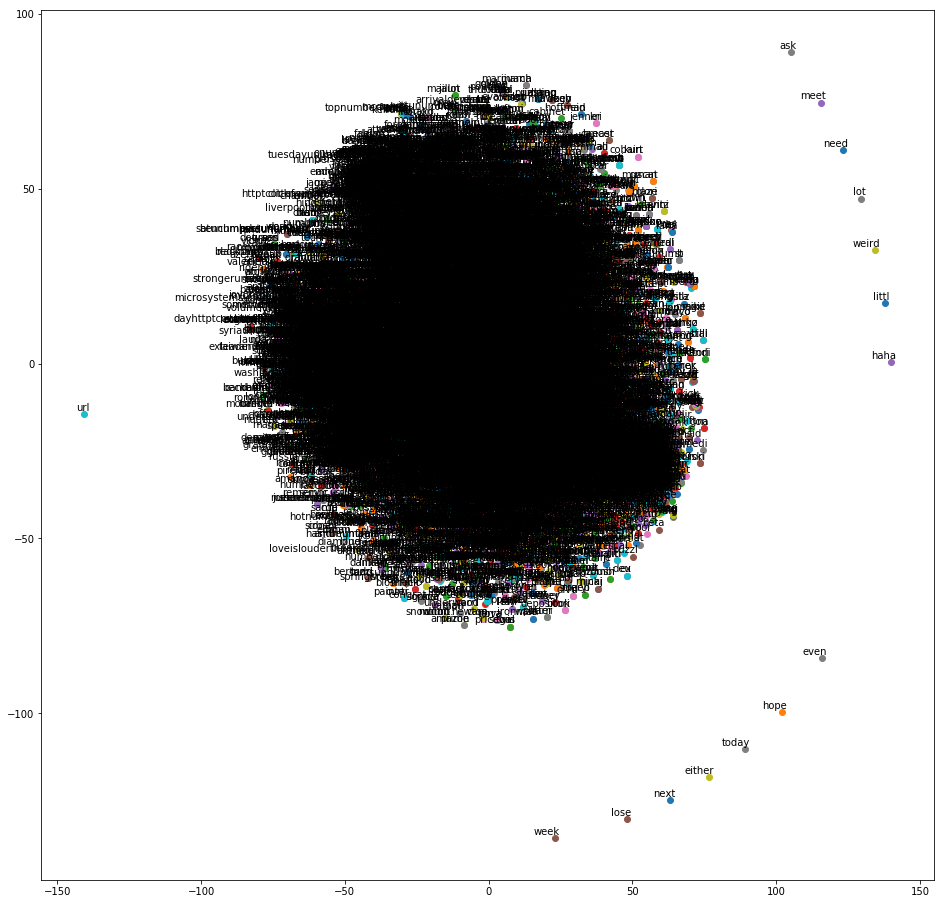

In [28]:
def tsne_plot(model):
    "Creates an TSNE model and plots it"
    labels = []
    tokens = []
    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []

    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16))
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i], xy=(x[i], y[i]), xytext=(5, 2), textcoords='offset points', ha='right', va='bottom')
    plt.show()
    
tsne_plot(model_w2v)

function for transforming every tweet to sentence embedding by taking the
average of the vectors of the words present in the tweet.

In [36]:
def transform(tweet):
        word2vec = gensim.models.Word2Vec.load("word2vec.model")
        #print(word2vec['user'])
        #print(word2vec['feel'])
        #print(word2vec['colt'])
        #print(word2vec['game'])
        #print(word2vec['sunday'])
        return np.array([
            np.mean([word2vec[w] for w in tweet if w in word2vec] #tweet=words kai xesxoliase thn grammh
                    or [np.zeros(200)], axis=0) #len(word2vec.itervalues().next())
            #for words in tweet
        ])

applying the function to train data tweets

In [37]:
data = data.apply(transform)
data
#cleaned_data = pd.read_pickle('train_data_clean.pkl')
#cleaned_data['feature']=0 #adding new column
#cleaned_data['feature'] = cleaned_data['tweet_text'].apply(transform)
##transform(cleaned_data['tweet_text'][28032])
#cleaned_data

C:\Users\Foufa\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
  if __name__ == '__main__':
C:\Users\Foufa\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


0        [[-0.28363207, -0.09304898, 0.4075626, 0.13655...
1        [[-0.14159304, -0.14611398, -0.02227959, -0.05...
2        [[0.1544209, -0.3225971, 0.17797239, -0.005464...
3        [[0.09125631, 0.0059119845, 0.0772114, -0.0625...
4        [[0.061597355, 0.1250349, 0.20085405, 0.246995...
5        [[0.22918944, -0.39448175, 0.21807466, -0.1766...
6        [[0.05517971, 0.07254962, 0.04436347, 0.054004...
7        [[-0.16410807, -0.23410629, 0.22440125, -0.290...
8        [[0.10753329, -0.35713267, 0.21219684, -0.0117...
9        [[0.073904656, -0.031518452, 0.1680708, 0.1244...
10       [[0.17428692, -0.17606898, -0.046595395, 0.121...
11       [[-0.05605231, 0.06466135, 0.15200093, -0.2244...
12       [[-0.09106448, 0.03789634, 0.24695973, 0.06448...
13       [[-0.02665706, -0.26552293, -0.019704979, 0.18...
14       [[0.19032896, 0.024037972, 0.40266252, 0.13465...
15       [[-0.025803387, -0.06935737, 0.1306519, 0.2283...
16       [[0.18445934, -0.16974731, 0.19864853, 0.05320.

saving the sentence embeddings for train data

In [49]:
data.to_pickle('train_word2vec.pkl')

applying the function to train data tweets

In [51]:
data_test = data_test.apply(transform)
data_test

C:\Users\Foufa\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__contains__` (Method will be removed in 4.0.0, use self.wv.__contains__() instead).
  if __name__ == '__main__':
C:\Users\Foufa\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


0        [[0.039713774, -0.20137702, 0.44498947, -0.022...
1        [[0.055562526, 0.09722394, 0.4169349, 0.135445...
2        [[0.21426284, 0.01756125, 0.44625917, 0.131562...
3        [[0.02716747, -0.059951607, 0.1671147, -0.0196...
4        [[-0.34469602, 0.20049748, 0.08007035, -0.1296...
5        [[0.13642232, -0.1417455, 0.3940807, 0.1645875...
6        [[0.094610095, 0.008806368, 0.38804257, 0.2007...
7        [[-0.049287155, -0.14488491, -0.15843417, -0.0...
8        [[-0.09847794, 0.14686003, 0.27474195, 0.11391...
9        [[0.20376249, -0.022960775, -0.0022095495, -0....
10       [[-0.0017510783, -0.13093461, 0.4177708, 0.194...
11       [[0.10195084, 0.21245722, 0.12245377, 0.308571...
12       [[-0.06012512, -0.25660127, 0.2074522, 0.08307...
13       [[0.1331043, -0.098062694, 0.4200022, 0.018558...
14       [[-0.24328181, -0.068131946, 0.042744044, -0.0...
15       [[0.05310644, -0.23013961, 0.1289335, 0.060151...
16       [[-0.039723154, -0.10635438, 0.0165981, -0.035.

saving the sentence embeddings for test data

In [52]:
data_test.to_pickle('test_word2vec.pkl')

Load sentence embeddings

In [7]:
train_w2v = pd.read_pickle('train_word2vec.pkl')
test_w2v = pd.read_pickle('test_word2vec.pkl')

# convert test_w2v and train_w2v to array so we can use them for classification #

for x in range(0,train_w2v.count()):
    train_w2v[x] = train_w2v[x][0].tolist()

for x in range(0,test_w2v.count()):
    test_w2v[x] = test_w2v[x][0].tolist()

train_w2v = train_w2v.tolist()
test_w2v = test_w2v.tolist()
train_w2v = array(train_w2v)
test_w2v = array(test_w2v)

# converted #


Add features from lexicon

In [9]:
def  tweet_sentiment_mean(tweet):
    z = 0
    mean = 0
    for x in range(0,lex['word'].count()):
        for y in range(0,len(tweet)-1):
            if lex['word'][x]==tweet[y]:
                z = z + lex['sentiment'][x]
    mean = z/len(tweet)
    return mean

In [11]:
train = loadData1 ()
test = loadData2 ()
train['tweet_text'] = train['tweet_text'].apply(wordTokenizeTweet)
test['tweet_text'] = test['tweet_text'].apply(wordTokenizeTweet)
#tweet_sentiment_mean(train['tweet_text'][17])

#add features to train_w2v
train_w2v_features=train_w2v
list1=[]
for x in range(0,train['tweet_text'].count()):
    list1.append(np.append(train_w2v_features[x],tweet_sentiment_mean(train['tweet_text'][x])))
list1

[array([-0.28363207, -0.09304898,  0.40756261,  0.13655731, -0.03093288,
         0.07697973,  0.18269509,  0.2699863 , -0.02089669,  0.23173827,
        -0.03790189, -0.12465104,  0.01821884, -0.10146879,  0.34269583,
        -0.02544044, -0.32345513,  0.01231401,  0.01530984, -0.18077998,
        -0.08837768, -0.01864378,  0.05160137,  0.11790987,  0.22042394,
        -0.49583313,  0.14814176, -0.16158344, -0.07165042, -0.16810498,
        -0.02667683,  0.17693165,  0.04918851, -0.22119321,  0.26070097,
        -0.06467844, -0.33071047, -0.03150349,  0.03007887,  0.08310588,
         0.00349047, -0.12082244,  0.2515659 , -0.09024926, -0.24452955,
        -0.1291931 , -0.09514785, -0.24559702, -0.05374955,  0.08985236,
         0.30122641, -0.34749094,  0.23287719, -0.06206736,  0.14969641,
        -0.08577433, -0.04369541,  0.06583922, -0.07637661, -0.02990588,
         0.07496408, -0.22819386,  0.03667377,  0.44127047, -0.05719207,
        -0.20722349, -0.05275584,  0.00593612, -0.2

In [12]:
#add features to test_w2v
test_w2v_features=test_w2v
list2=[]
for x in range(0,test['tweet_text'].count()):
    list2.append(np.append(test_w2v_features[x],tweet_sentiment_mean(test['tweet_text'][x])))
list2

[array([ 0.03971377, -0.20137702,  0.44498947, -0.02200783, -0.01932733,
         0.01124945,  0.37543803,  0.15935162,  0.02172076,  0.17488524,
        -0.04515478, -0.00996659, -0.26114887, -0.05852963,  0.13500927,
        -0.06412052, -0.25911459, -0.06492354,  0.01934336, -0.04987384,
        -0.11749467,  0.07774944,  0.1709764 ,  0.07897822,  0.12409182,
        -0.34329802,  0.31487852,  0.0443657 , -0.26030448, -0.23134229,
        -0.11568028, -0.0218798 , -0.06273901, -0.32036349,  0.11745628,
         0.03877169, -0.30551985, -0.12247349,  0.2705985 ,  0.03210232,
        -0.02311745,  0.14882647,  0.16270253, -0.08256634, -0.18037185,
        -0.12880264, -0.18754768,  0.09103633, -0.08526435,  0.03242387,
         0.23706388, -0.362571  , -0.07336385,  0.08647961, -0.09562935,
        -0.05854329, -0.09882816,  0.00252411,  0.10641622,  0.0884543 ,
        -0.01701781, -0.33478117,  0.0142538 , -0.00287235,  0.336781  ,
         0.0792864 , -0.27186856,  0.03716569, -0.3

In [14]:
train_w2v_features = array(list1)
test_w2v_features = array(list2)
train_w2v_features

array([[-0.28363207, -0.09304898,  0.40756261, ...,  0.0341386 ,
        -0.21383256,  0.        ],
       [-0.14159304, -0.14611398, -0.02227959, ...,  0.0444885 ,
        -0.2196499 , -0.25      ],
       [ 0.1544209 , -0.32259709,  0.17797239, ..., -0.11854032,
        -0.06037831,  0.        ],
       ...,
       [ 0.02756277,  0.00645341,  0.108354  , ..., -0.08038391,
        -0.15602742,  0.        ],
       [ 0.02344629, -0.00597189,  0.18300702, ..., -0.16371678,
        -0.16525368,  0.06666667],
       [-0.03299622,  0.1499702 ,  0.46351317, ..., -0.10729121,
         0.09499793,  0.        ]])

KNN Classification with bag of words

In [15]:
knn = KNeighborsClassifier(n_neighbors=1)
bow_X = bow_train
bow_Y = cleaned_train_data['sentiment']
#np.unique(bow_Y)
knn = knn.fit(bow_X , bow_Y)
X_new= bow_test
prediction=knn.predict(X_new)
#np.set_printoptions(threshold=sys.maxsize)
#print(prediction)
answers=loadData3 ()
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.37495929664604366


KNN Classification with tf_idf

In [16]:
knn = KNeighborsClassifier(n_neighbors=1)
tfidf_X = tfidf_train
tfidf_Y = cleaned_train_data['sentiment']
#np.unique(bow_Y)
knn = knn.fit(tfidf_X , tfidf_Y)
X_new= tfidf_test
prediction=knn.predict(X_new)
#np.set_printoptions(threshold=sys.maxsize)
#print(prediction)
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.40377727124715074


KNN Classification with word embeddings

In [122]:
knn = KNeighborsClassifier(n_neighbors=1)
word_emb_X = train_w2v
word_emb_Y = cleaned_train_data['sentiment']
#np.unique(bow_Y)
knn = knn.fit(word_emb_X , word_emb_Y)
X_new= test_w2v
prediction=knn.predict(X_new)
#np.set_printoptions(threshold=sys.maxsize)
#print(prediction)
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.4326766525561706


KNN Classification with word embeddings with features

In [18]:
knn = KNeighborsClassifier(n_neighbors=1)
word_emb_X = train_w2v_features
word_emb_Y = cleaned_train_data['sentiment']
#np.unique(bow_Y)
knn = knn.fit(word_emb_X , word_emb_Y)
X_new= test_w2v_features
prediction=knn.predict(X_new)
#np.set_printoptions(threshold=sys.maxsize)
#print(prediction)
answers=loadData3 ()
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.43951481602084014


SVM Classification with bag of word

In [22]:
svc = svm.SVC(kernel='linear', C=1, probability=False)
bow_X = bow_train
bow_Y = cleaned_train_data['sentiment']
svc = svc.fit(bow_X , bow_Y)
#X_new = bow_test
#prediction = svc.predict_proba(X_new)
#f1_score(answers['sentiment'], prediction)

In [23]:
X_new = bow_test
prediction = svc.predict(X_new)

In [25]:
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.39425268642136113


SVM Classification with tf_idf

In [123]:
svc = svm.SVC(kernel='linear', C=1, probability=False)
tfidf_X = tfidf_train
tfidf_Y = cleaned_train_data['sentiment']
svc = svc.fit(tfidf_X , tfidf_Y)
X_new = tfidf_test
prediction = svc.predict(X_new)
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.3941712797134484


SVM Classification with word embeddings

In [124]:
svc = svm.SVC(kernel='linear', C=1, probability=False)
word_emb_X = train_w2v
word_emb_Y = cleaned_train_data['sentiment']
svc = svc.fit(word_emb_X , word_emb_Y)
X_new = test_w2v
prediction = svc.predict(X_new)
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.5288179746011071


SVM Classification with word embeddings with features

In [19]:
svc = svm.SVC(kernel='linear', C=1, probability=False)
word_emb_X = train_w2v_features
word_emb_Y = cleaned_train_data['sentiment']
svc = svc.fit(word_emb_X , word_emb_Y)
X_new = test_w2v_features
prediction = svc.predict(X_new)
print(metrics.accuracy_score(answers['sentiment'], prediction))

0.5528329534353631


Results table

In [20]:
column_names = ['KNN', 'SVM']
row_names    = ['Bag of words', 'tf_idf', 'word embeddings', 'word embeddings-features']

matrix = np.reshape((0.3749, 0.3942, 0.4037, 0.3941, 0.4326, 0.5288, 0.4395, 0.5528), (4, 2))
df = pd.DataFrame(matrix, columns=column_names, index=row_names)
df

#import seaborn as sns

#cm = sns.light_palette("teal", as_cmap=True)

#s = df.style.background_gradient(cmap=cm)
#s

def color(val):
    color = 'teal'
    return 'background-color: %s' % color

df.style.applymap(color, subset=['SVM'])


,KNN,SVM
Bag of words,0.3749,0.3942
tf_idf,0.4037,0.3941
word embeddings,0.4326,0.5288
word embeddings-features,0.4395,0.5528


In general SVM classifier appears to be better than KNN.Also using word embeddings is a better choice than tf_idf and bag of words. Word embeddings with features give better results with both classifiers.